<a href="https://colab.research.google.com/github/andrea-lopera/Identifying-Water-Bodies-Near-Drought-Affected-Regions/blob/main/Final_Capstone_Project_Team2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Capstone Project: Identifying Water Bodies Near Drought-Affected Regions

This capstone project aims to analyze spatial patterns of drought severity, locate nearby water sources, and evaluate their accessibility and sustainability to provide actionable solutions for water resource management—initially in the area of La Guajira, Colombia. However, the application of the model extends to other regions globally. La Guajira faces a severe drought crisis, exacerbated by climate change, land use —unsustainable practices, and inadequate water resource management. The Wayuu, the most important Indigenous community in Colombia, lives in this arid area. The community uses “Jagueyes” —a traditional water conservation method for agriculture, livestock, and human needs during predictable drought periods. Still, prolonged droughts, coupled with environmental degradation from coal mining and dam construction, have led to contaminated and insufficient water supplies. Resulting in a humanitarian crisis where malnutrition, waterborne diseases, and displacement affect vulnerable populations. Addressing this crisis requires identifying accessible and sustainable water bodies near drought-affected areas to support water resource management and mitigate the socio-ecological impacts on the region.

#1. Introduction

- Objective:
  - Analyze spatial patterns of drought severity and identify nearby accessible water sources.
  - Evaluate sustainability of water bodies to support actionable solutions for water resource management.
  - Focus on La Guajira’s drought crisis while ensuring global scalability.

- Key Goals:
  - Clustering regions based on water accessibility.
  - Forecasting NDWI trends using Hybrid SARIMA + Bidirectional LSTM.
  - Evaluating the Sustainability of Water Bodies.
  - Providing Actionable Solutions for Water Resource Management




#2. Data Preprocessing

## 2.1 Initialize Environment

In [ ]:
# Install earthengine-api
!pip install earthengine-api

In [ ]:
import ee
ee.Authenticate()

# Initialize Earth Engine with the project ID
ee.Initialize(project='ee-sxp7411')

# Test Initialization
print("Earth Engine initialized successfully!")

## 2.2 Load and Prepare the Region

In [ ]:
# Load the uploaded hexagonal boundary
la_guajira_boundary = ee.FeatureCollection("projects/ee-sxp7411/assets/LA_GUAJIRA")

# Print boundary details to verify(use this to know about data)
la_guajira_boundary.getInfo()

## 2.3 Extract NDWI from Sentinel-2
- Filter Sentinel-2 data for cloud cover <20% and compute NDWI (normalizedDifference of bands B3 and B8)
- Export NDWI values as a time-series dataset for forecasting in later sections.

In [ ]:
!pip install geemap

In [ ]:
import geemap

# Function to calculate NDWI and tag images with dates
def compute_ndwi_with_date(image):
    ndwi = image.normalizedDifference(['B3', 'B8']).rename('NDWI')
    return ndwi.set('date', image.date().format('YYYY-MM-dd'))

# Load Sentinel-2 data and compute NDWI with dates
s2_ndwi = (
    ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
    .filterBounds(la_guajira_boundary)
    .filterDate("2020-01-01", "2024-12-31")
    .filter(ee.Filter.lt("CLOUDY_PIXEL_PERCENTAGE", 20))
    .map(compute_ndwi_with_date)
)

# Function to reduce NDWI to a regional average
def compute_average_ndwi(image):
    ndwi_mean = image.reduceRegion(
        reducer=ee.Reducer.mean(),
        geometry=la_guajira_boundary.geometry(),
        scale=300,
        maxPixels=1e13
    )
    return ee.Feature(None, {
        'date': image.get('date'),
        'NDWI': ndwi_mean.get('NDWI')
    })

# Apply the reduction to compute average NDWI for each image
ndwi_features = s2_ndwi.map(compute_average_ndwi)

# Convert to a FeatureCollection
ndwi_time_series = ee.FeatureCollection(ndwi_features)

# Export the time-series data to CSV
geemap.ee_export_vector(ndwi_time_series, filename='ndwi_timeseries.csv')

##  SRTM (Shuttle Radar Topography Mission) DEM dataset

Introducion of elevation data. SRTM DEM is a global elevation model that provides elevation values for every pixel. It's useful for analyzing topographic features and understanding how elevation might affect water distribution or drought conditions.



In [ ]:
import ee
import geemap

# Initialize Earth Engine
ee.Authenticate()
ee.Initialize(project='ee-sxp7411')

# Parameters
la_guajira_boundary = ee.FeatureCollection("projects/ee-sxp7411/assets/LA_GUAJIRA")

# Load SRTM DEM
srtm = ee.Image("USGS/SRTMGL1_003").clip(la_guajira_boundary)

# Visualization parameters for SRTM
srtm_vis = {"min": 0, "max": 3000, "palette": ["green", "yellow", "red"]} # Elevation ranges from 0 to 3000 meters, with lower elevations in green and higher elevations in red.

# Create an interactive map
Map = geemap.Map(center=[11.414616, -72.406349], zoom=8) # Initializes a map centered on La Guajira

# Add La Guajira boundary
Map.addLayer(la_guajira_boundary, {}, "La Guajira Boundary")

# Add SRTM elevation layer
Map.addLayer(srtm, srtm_vis, "SRTM Elevation") # Displays the SRTM DEM data with elevation visualized.

# Display the map
Map

Note: Elevation impacts water availability. Higher elevations may have less water accumulation, while lower elevations might indicate flood plains or basins.


# 3. Clustering Analysis

## 3.1 K-Means Clustering

### 3.1.1 K-Means with Synthetic Water Mask
- **Purpose:** Demonstrates clustering with a synthetic water mask as a baseline method.
- **Key Steps:**
  - Generate a synthetic water mask using random values clipped to La Guajira’s boundary.
  - Convert water mask to vector points and add centroid coordinates (X, Y).
  - Apply K-Means clustering using wekaKMeans.
  - Assign random colors to clusters for visualization.
- **Visualization:**
  - Add clusters to an interactive map using Geemap, with points categorized by color and labeled by cluster ID.

In [ ]:
import ee
import geemap
import random

# Initialize Earth Engine
ee.Authenticate()
ee.Initialize(project='ee-sxp7411')

# Parameters
la_guajira_boundary = ee.FeatureCollection("projects/ee-sxp7411/assets/LA_GUAJIRA")
ndwi_threshold = 0.2
scale = 100  # Adjust scale as needed
num_clusters = 5  # Adjust number of clusters

# Synthetic Water Mask (Replace with your actual NDWI processing)
water_mask = ee.Image.random().gt(0.7).selfMask().clip(la_guajira_boundary)

# Convert water mask to points, explicitly adding X and Y coordinates
def add_xy(feature):
    centroid = feature.geometry().centroid()
    return feature.set({
        'X': centroid.coordinates().get(0),
        'Y': centroid.coordinates().get(1)
    })

water_points = water_mask.reduceToVectors(
    reducer=ee.Reducer.countEvery(),
    geometry=la_guajira_boundary,
    scale=scale,
    geometryType='centroid',
    eightConnected=True,
    maxPixels=1e13,
    bestEffort=True  # Add bestEffort to potentially handle errors
).map(add_xy)

# K-Means Clustering
kmeans_clusterer = ee.Clusterer.wekaKMeans(num_clusters).train(water_points, ee.List(['X', 'Y']))  # Cluster on X and Y
clustered_kmeans = water_points.cluster(kmeans_clusterer)

# Create a FeatureCollection of cluster colors
def random_color():
    return '#%02X%02X%02X' % (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))

cluster_colors = ee.FeatureCollection([
    ee.Feature(None, {'cluster': i, 'color': random_color()})
    for i in range(num_clusters)
])

# Join cluster colors to the clustered features
joined_clusters = clustered_kmeans.map(lambda feature:
    feature.set('color', cluster_colors.filter(ee.Filter.eq('cluster', feature.get('cluster'))).first().get('color')) # Associates each cluster with its corresponding random color
)

# Create a map
Map = geemap.Map(center=[11.414616, -72.406349], zoom=8)

# Add the clustered features with styling parameters
for i in range(num_clusters):
    color = cluster_colors.filter(ee.Filter.eq('cluster', i)).first().getString('color').getInfo()
    Map.addLayer(
        joined_clusters.filter(ee.Filter.eq('cluster', i)),
        {'color': color},
        f'K-Means Cluster {i}'
    )

Map.addLayer(la_guajira_boundary, {}, "La Guajira Boundary")
Map.addLayer(water_mask, {'palette': 'blue'}, "Water Mask")
Map

### 3.1.2 K-Means with Real NDWI-Based Water Mask
- **Purpose:** Applies K-Means clustering using real NDWI data for accurate water detection.
- **Key Steps:**
  - Compute NDWI for Sentinel-2 data within a specific date range (e.g., 2024-01-01 to 2024-02-10).
  - Create a water mask based on NDWI threshold (>0.2).
  - Extract pixel coordinates (X, Y) and sample water mask to create FeatureCollection.
  - Apply K-Means clustering using wekaKMeans.
  - Assign random colors to clusters for enhanced visualization.
- **Visualization:**
  - Add clusters to an interactive map, layering water masks, HydroSHEDS basins, and JRC water occurrence data for context.

In [ ]:
import ee
import geemap
import random

# Initialize Earth Engine
ee.Authenticate()
ee.Initialize(project='ee-sxp7411')

# Parameters
la_guajira_boundary = ee.FeatureCollection("projects/ee-sxp7411/assets/LA_GUAJIRA")
ndwi_threshold = 0.2
scale = 300  # Adjust scale as needed
num_clusters = 5  # Initial guess for the number of clusters
cloud_percentage_clustering = 10
ndwi_vis = {"min": -1, "max": 1, "palette": ["white", "blue"]}  # NDWI visualization parameters
water_vis = {"palette": ["blue"]}  # Water mask visualization parameters

# Load Sentinel-2 and Calculate NDWI for Clustering Year
def load_and_calc_ndwi(boundary, start, end, cloud_pct):
    try:
        sentinel2 = (
            ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
            .filterBounds(boundary)
            .filterDate(start, end)
            .filter(ee.Filter.lt("CLOUDY_PIXEL_PERCENTAGE", cloud_pct))
            .median()
            .clip(boundary)
        )
        ndwi = sentinel2.normalizedDifference(["B3", "B8"]).rename("NDWI")
        return ndwi
    except Exception as e:
        print(f"Error loading and calculating NDWI: {e}")
        return None

# Calculate NDWI for clustering
ndwi_image_clustering = load_and_calc_ndwi(
    la_guajira_boundary,
    "2024-01-01",
    "2024-02-10",
    cloud_percentage_clustering
)

if ndwi_image_clustering is None:
    print("NDWI calculation failed. Exiting.")
    exit()

# Create Water Mask for Clustering Year
water_mask_clustering = ndwi_image_clustering.gt(ndwi_threshold).selfMask()

# --- K-Means Clustering in Earth Engine ---
# Convert the water mask to a single-band image with pixel coordinates
xy = water_mask_clustering.pixelCoordinates(ee.Projection('EPSG:4326'))
image_with_xy = water_mask_clustering.addBands(xy.select(['x', 'y']))

# Sample the image to create a FeatureCollection
sampled_features = image_with_xy.sample(
    region=la_guajira_boundary,
    scale=scale,
    geometries=True,  # Include the point geometry
    seed=0
)

# Cluster the FeatureCollection using K-Means
clusterer = ee.Clusterer.wekaKMeans(num_clusters).train(sampled_features, ee.List(['x', 'y']))  # Specify input properties as a List
clustered_features = sampled_features.cluster(clusterer)

# Create a FeatureCollection of cluster colors
def random_color():
    return '#%02X%02X%02X' % (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))

cluster_colors = ee.FeatureCollection([
    ee.Feature(None, {'cluster': i, 'color': random_color()})
    for i in range(num_clusters)
])

# Join cluster colors to the clustered features
joined_clusters = clustered_features.map(lambda feature:
    feature.set('color', cluster_colors.filter(ee.Filter.eq('cluster', feature.get('cluster'))).first().get('color'))
)

# Create a map
Map = geemap.Map(center=[11.414616, -72.406349], zoom=8)
Map.addLayer(la_guajira_boundary, {}, "La Guajira Boundary")
Map.addLayer(water_mask_clustering, water_vis, "Water Mask")

# Add the clustered features with styling parameters
for i in range(num_clusters):
    color = cluster_colors.filter(ee.Filter.eq('cluster', i)).first().getString('color').getInfo()
    Map.addLayer(
        joined_clusters.filter(ee.Filter.eq('cluster', i)),
        {'color': color},
        f'K-Means Cluster {i}'
    )

# Add NDWI layers for multiple years
years = ["2020", "2021", "2022", "2023", "2024"]

for year in years:
    ndwi_year = load_and_calc_ndwi(
        la_guajira_boundary,
        f"{year}-01-01",
        f"{year}-02-10",
        cloud_percentage_clustering
    )
    if ndwi_year:
        Map.addLayer(ndwi_year, ndwi_vis, f"NDWI - {year} (Clipped)")

# Load HydroSHEDS HydroBasins dataset
hydro_basins = ee.FeatureCollection("WWF/HydroSHEDS/v1/Basins/hybas_6")

# Load HydroSHEDS rivers dataset
hydro_rivers = ee.FeatureCollection("WWF/HydroSHEDS/v1/FreeFlowingRivers")

# Filter HydroSHEDS data to La Guajira region
hydro_basins_lg = hydro_basins.filterBounds(la_guajira_boundary).map(lambda f: f.intersection(la_guajira_boundary))
hydro_rivers_lg = hydro_rivers.filterBounds(la_guajira_boundary).map(lambda f: f.intersection(la_guajira_boundary))

# Add Clipped HydroSHEDS layers to the map
Map.addLayer(hydro_basins_lg, {"color": "yellow"}, "HydroSHEDS Water Basins (Clipped)")
Map.addLayer(hydro_rivers_lg, {"color": "blue"}, "HydroSHEDS Rivers (Clipped)")

# Load JRC Global Surface Water Dataset
jrc_water = ee.Image("JRC/GSW1_4/GlobalSurfaceWater").clip(la_guajira_boundary)

# Apply visualization for water occurrence
Map.addLayer(jrc_water, {"bands": ["occurrence"], "min": 0, "max": 100, "palette": ["white", "blue"]}, "JRC Global Surface Water (Clipped)")

# Show the updated map
Map

In [ ]:
import matplotlib.pyplot as plt
import ee

# Get cluster colors
cluster_colors_dict = {}
for i in range(num_clusters):
    color = cluster_colors.filter(ee.Filter.eq('cluster', i)).first().getString('color').getInfo()
    cluster_colors_dict[i] = color

# Extract cluster data for plotting
cluster_data = []
for i in range(num_clusters):
    cluster_features = joined_clusters.filter(ee.Filter.eq('cluster', i)).getInfo()['features']
    for feature in cluster_features:
        cluster_data.append({
            'cluster': i,
            'x': feature['properties']['x'],
            'y': feature['properties']['y'],
            'color': cluster_colors_dict[i]  # Assign color based on cluster
        })

# Create the plot
plt.figure(figsize=(10, 8))

for point in cluster_data:
    plt.scatter(point['x'], point['y'], c=[point['color']], label=f'Cluster {point["cluster"]}' if point["cluster"] not in [c["cluster"] for c in cluster_data[:cluster_data.index(point)]] else "")  # Only show label for the first point of each cluster

# Customize the plot
plt.title('Spatial Coverage Visualization of Clusters')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

This plot shows how different clusters are spread out across part of La Guajira, based on their geographic location. Each color represents a separate cluster, and the points are placed according to their longitude and latitude. We can see that the clusters form long vertical patterns, which might follow rivers, roads, or other natural features in the region. The top part of the plot (near latitude 12.4) includes some coastal or northern areas, while the bottom part (around latitude 11.6) represents more inland or southern locations. This spatial view helps us understand how the clusters cover the region and shows where each group of similar data points is found on the map. It is useful for planning water resources and planning well in advance droughts occur.

## 3.2 DBSCAN (Density-Based Spatial Clustering of Applications with Noise)

Cluster regions based on water accessibility. Identify high-density clusters vs. outlier regions with low water proximity.

### 3.2.1 Density-Based Clustering

- Purpose: Analyzes irregular spatial patterns using density-based DBSCAN clustering.
- Key Steps:
1. Preprocess Data:
  - Normalize soil moisture or drought-related values.
  - Extract relevant columns: latitude, longitude, soil moisture.
2. Build Feature Matrix
  - [latitude, longitude, soil_moisture] as clustering input.
  - Optionally include time (as a numeric value).
3. Apply DBSCAN
  - Choose eps and min_samples based on domain and visual exploration.
  - Label drought "hotspots" as clusters.
4. Visualize Results
  - Use scatter maps or Folium to show clusters on a geographic map.

In [ ]:
# Drought and Water Resource Analysis Pipeline for La Guajira
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import folium
from folium.plugins import MarkerCluster

# Step 1: Load and Prepare Data
def load_cluster_data(csv_path):
    df = pd.read_csv(csv_path)
    df = df.rename(columns={"X": "longitude", "Y": "latitude"})
    return df


# Step 2: Perform DBSCAN Clustering
def run_dbscan(df, eps=0.05, min_samples=10):
    features = df[["latitude", "longitude"]]
    scaler = StandardScaler()
    scaled = scaler.fit_transform(features)

    db = DBSCAN(eps=eps, min_samples=min_samples).fit(scaled)
    df["dbscan_label"] = db.labels_
    return df

# Step 3: Load Boundary GeoJSON
def load_boundary_geojson(geojson_path):
    gdf_boundary = gpd.read_file(geojson_path)
    return gdf_boundary

# Step 4: Spatial Join (Filter Clusters by Region)
def filter_clusters_by_region(df_clusters, gdf_boundary):
    gdf_clusters = gpd.GeoDataFrame(
        df_clusters,
        geometry=[Point(xy) for xy in zip(df_clusters.longitude, df_clusters.latitude)],
        crs="EPSG:4326"
    )
    gdf_filtered = gpd.sjoin(gdf_clusters, gdf_boundary, how="inner", predicate="intersects")
    return gdf_filtered

# Step 5: Visualize in Folium
def plot_clusters_folium(gdf_filtered):
    center_lat = gdf_filtered.latitude.mean()
    center_lon = gdf_filtered.longitude.mean()
    m = folium.Map(location=[center_lat, center_lon], zoom_start=8)
    marker_cluster = MarkerCluster().add_to(m)

    for _, row in gdf_filtered.iterrows():
        folium.CircleMarker(
            location=[row["latitude"], row["longitude"]],
            radius=3,
            color='blue' if row['dbscan_label'] != -1 else 'red',
            fill=True,
            fill_opacity=0.6,
            popup=f"Cluster: {row['dbscan_label']}"
        ).add_to(marker_cluster)

    return m

# Main execution
df = load_cluster_data("/content/ExportClusteredPoints.csv")
df = run_dbscan(df)
gdf_boundary = load_boundary_geojson("/content/LaGuajira_Boundary_Export.geojson")
gdf_filtered = filter_clusters_by_region(df, gdf_boundary)
m = plot_clusters_folium(gdf_filtered)
m  # This will display in Google Colab

### 3.2.2 Summary of Clusters

In [ ]:
# Summary of clusters
summary = gdf_filtered.groupby('dbscan_label').agg(
    points=('dbscan_label', 'count'),
    avg_lat=('latitude', 'mean'),
    avg_lon=('longitude', 'mean')
).reset_index()

summary.sort_values(by='points', ascending=False)

### 3.2.3 Spatial Coverage Visualization

In [ ]:
import matplotlib.pyplot as plt

gdf_filtered.plot(column='dbscan_label', categorical=True, legend=True, figsize=(10, 10))
plt.title('DBSCAN Clusters in La Guajira')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

### 3.2.4 Proximity Analysis
- Purpose: Computes distances from DBSCAN clusters to the nearest water sources.
- Key Steps:
  - Use spatial indexing with JRC water polygons.
  - Calculate nearest distance for each cluster point to water sources.
  - Summarize distances (mean, min, max) by cluster.
- Visualization:
  - Bar charts highlighting average cluster distance to water sources.

In [ ]:
import geopandas as gpd
from shapely.ops import nearest_points
import matplotlib.pyplot as plt

# Load water polygons
gdf_water = gpd.read_file("/content/JRC_Water_Polygons.geojson")

# Build spatial index
water_sindex = gdf_water.sindex

# Compute nearest distance from each point to the nearest water polygon
def get_nearest_water_distance(point):
    nearest_index = list(water_sindex.nearest(point, 1))[0]  # now passing geometry, not bounds
    nearest_geom = gdf_water.geometry.iloc[nearest_index]
    return point.distance(nearest_geom)

# Apply with spatial index optimization
gdf_filtered['distance_to_water'] = gdf_filtered.geometry.apply(get_nearest_water_distance)

# Summarizing Distance to Water
distance_summary = gdf_filtered.groupby('dbscan_label')['distance_to_water'].agg(['mean', 'min', 'max', 'count']).reset_index()

# Visualizing (Bar Chart)
plt.figure(figsize=(8, 5))
plt.bar(distance_summary['dbscan_label'].astype(str), distance_summary['mean'] * 111000, color='mediumseagreen')
plt.xlabel("DBSCAN Cluster Label")
plt.ylabel("Average Distance to Water (meters)")
plt.title("Average Distance to Water by Cluster")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Folium Map Layer visualization
import folium

m = folium.Map(location=[gdf_filtered['latitude'].mean(), gdf_filtered['longitude'].mean()], zoom_start=8)

for _, row in gdf_filtered.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='blue' if row['distance_to_water'] < 0.01 else 'red',
        fill=True,
        fill_opacity=0.6,
        popup=f"Cluster: {row['dbscan_label']}<br>Dist: {row['distance_to_water']*111000:.0f}m"
    ).add_to(m)

m

Findings:
The DBSCAN clustering process revealed several key insights about the spatial distribution of drought-related soil moisture patterns in La Guajira.

- The most prominent result is Cluster 0, which contains 52,689 points, making it by far the largest and most dominant cluster in the dataset. Its centroid is located around 11.86°N, -71.96°W, which likely corresponds to a broad, uniform zone with similar soil moisture characteristics. This area should be considered the primary focus for drought analysis and intervention, as it represents the most significant concentration of data points with similar environmental conditions.

- Following Cluster 0, Cluster 7 contains 345 points, centered around 11.01°N, -72.80°W. While much smaller in scale, its relative size suggests the presence of a secondary drought zone, potentially near coastal or lowland areas. Perhaps caused by different land-use patterns, hydrology, or microclimatic effects.

- Other mid-sized clusters, such as Cluster 5 (164 points) and Cluster 10 (94 points), are situated in slightly different parts of La Guajira. Their smaller but non-negligible size indicates the presence of localized drought hotspots, which may reflect fragmented drought patches or regions with elevation-induced variation in moisture availability.

- Several clusters, including Clusters 2, 8, 4, and 6, contain fewer than 80 points each. These are considered minor clusters and may represent either meaningful small-scale drought pockets or artifacts resulting from clustering either near the edges of the region or near transitional zones between different land or water covers.

- Lastly, Cluster -1, which includes 12 points, represents noise points that DBSCAN could not assign to any cluster. These are likely outliers—either due to anomalous measurements or isolated geographic conditions that differ significantly from the surrounding data.

Together, these findings highlight a mix of widespread and localized drought conditions. While Cluster 0 dominates the landscape, the presence of several smaller clusters emphasizes the importance of evaluating sub-regional drought behavior and considering multiple scales of intervention for water resource planning and resilience building.

## 3.3 Comparative Analysis
- Compare K-Means and DBSCAN on:
  - Spatial cluster characteristics
  - Strengths/limitations in your drought + water context

- Possibly visualize or summarize key metrics (e.g., cluster compactness, number of outliers, distance to water)

- End with insightful commentary on which method is more useful, or when each is appropriate

- Suggest how this analysis ties into future steps (e.g., NDWI forecasts, policy use)

In [ ]:
import pandas as pd

# Load KMeans data
df_kmeans = pd.read_csv("/content/KMeans_Clustered_Export.csv")
df_kmeans.head()

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import shape
import json
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN

# Load DBSCAN-labeled points
df_dbscan = pd.read_csv("/content/ExportClusteredPoints.csv")
df_dbscan = df_dbscan.rename(columns={"X": "longitude", "Y": "latitude"})
df_dbscan['geometry'] = gpd.points_from_xy(df_dbscan.longitude, df_dbscan.latitude)
gdf_dbscan = gpd.GeoDataFrame(df_dbscan, geometry='geometry', crs="EPSG:4326")

# Run DBSCAN
features = gdf_dbscan[["latitude", "longitude"]]
scaled = StandardScaler().fit_transform(features)
gdf_dbscan['dbscan_label'] = DBSCAN(eps=0.05, min_samples=10).fit_predict(scaled)

# Load exported KMeans CSV
df_kmeans = pd.read_csv("/content/KMeans_Clustered_Export.csv")

if '.geo' in df_kmeans.columns:
    df_kmeans['geometry'] = df_kmeans['.geo'].apply(lambda g: shape(json.loads(g)))
elif 'longitude' in df_kmeans.columns and 'latitude' in df_kmeans.columns:
    df_kmeans['geometry'] = gpd.points_from_xy(df_kmeans.longitude, df_kmeans.latitude)

gdf_kmeans = gpd.GeoDataFrame(df_kmeans, geometry='geometry', crs="EPSG:4326")

# Spatial join: match DBSCAN with nearest KMeans points
gdf_merged = gpd.sjoin_nearest(
    gdf_dbscan[['geometry', 'dbscan_label']],
    gdf_kmeans[['geometry', 'cluster']],
    how="inner",
    distance_col="join_dist_m"
)

# Compute comparison metrics
n_clusters_kmeans = gdf_merged['cluster'].nunique()
n_clusters_dbscan = gdf_merged['dbscan_label'].nunique() - (1 if -1 in gdf_merged['dbscan_label'].unique() else 0)
n_outliers = (gdf_merged['dbscan_label'] == -1).sum()
outlier_ratio = n_outliers / len(gdf_merged)

# Points per cluster
kmeans_counts = gdf_merged['cluster'].value_counts().sort_index()
dbscan_counts = gdf_merged[gdf_merged['dbscan_label'] != -1]['dbscan_label'].value_counts().sort_index()

# Plot
fig, ax = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

kmeans_counts.plot(kind='bar', ax=ax[0], color='cornflowerblue')
ax[0].set_title("K-Means: Points per Cluster")
ax[0].set_xlabel("Cluster Label")
ax[0].set_ylabel("Number of Points")
ax[0].grid(True)

dbscan_counts.plot(kind='bar', ax=ax[1], color='salmon')
ax[1].set_title("DBSCAN: Points per Cluster (No Outliers)")
ax[1].set_xlabel("Cluster Label")
ax[1].grid(True)

plt.tight_layout()
plt.show()

# Summary table
summary = pd.DataFrame({
    "Metric": [
        "# Clusters (KMeans)",
        "# Clusters (DBSCAN)",
        "# Outliers (DBSCAN)",
        "% Outliers (DBSCAN)"
    ],
    "Value": [
        n_clusters_kmeans,
        n_clusters_dbscan,
        n_outliers,
        round(outlier_ratio * 100, 2)
    ]
})

from IPython.display import display
display(summary)

## General Results:
- K-Means model grouped all points into 5 uniform clusters.
- DBSCAN discovered 12 natural-density clusters (irregular shapes).
- Only 12 points didn’t belong to any cluster — very few were isolated.
- Just a tiny portion of the data was labeled as noise or sparse.

**K-Means (Left Plot):**
- Clusters are more balanced in size, especially Cluster 1 and 3.
- Assumes clusters are evenly shaped and spaced (which works well if data is uniformly distributed).
- Could miss small, dense drought pockets or edge cases, especially in heterogeneous environments like La Guajira.

**DBSCAN (Right Plot):**
- Cluster 0 dominates — suggesting one large contiguous drought-prone zone.
- Many of the other clusters have very few points, which likely represent:
- Peripheral drought zones, or
- Sparsely located water-accessible regions.
- Excellent for identifying irregular patterns, small anomalies, and natural data shapes.


In terms of water resource planning:
- K-Means helps delineate large management zones — useful for regional planning or bulk resource allocation.

- DBSCAN gives finer control — ideal for targeted interventions, e.g., isolated communities or variable drought intensities.

- Combining both gives a multi-scale understanding of drought severity and resource accessibility

# 4. NDWI Forecasting
## 4.1 SARIMA Modeling (NDWI Forecasting with Hybrid SARIMA + LSTM)

Fit SARIMA to NDWI time series for seasonal trend forecasting.

- Step 1: Install Required Packages  
Install all the necessary Python packages for Earth Engine, geospatial processing, and deep learning.

- Step 2: Import Libraries  
Import Earth Engine, geemap for visualization and export, pandas/numpy for data manipulation, matplotlib for plotting, SARIMA for statistical time series modeling, and TensorFlow for LSTM neural network modeling.

- Step 3: Authenticate and Initialize Earth Engine  
Authenticate with Google Earth Engine using your account and initialize it with your project ID.

- Step 4: Load Region and Sentinel-2 Data  
Load the region of interest (La Guajira) as a feature collection, and access Sentinel-2 imagery. Filter the images by region, date range, and cloud cover. Then, compute NDWI from each image using the Green (B3) and NIR (B8) bands.

- Step 5: Sample NDWI Values Across Region  
Reduce each image into a single average NDWI value for the region using `reduceRegion()`. Then, store each result as a feature tagged with the acquisition date.

- Step 6: Export NDWI Samples to CSV  
Export the NDWI feature collection from Earth Engine to a CSV file and load it into a pandas DataFrame for time series modeling.

- Step 7: Clean and Structure Time Series  
Convert the date column to datetime format, remove missing values, sort by date, and resample the NDWI data to a monthly frequency using interpolation.

- Step 8: Fit SARIMA Model  
Use SARIMA (Seasonal AutoRegressive Integrated Moving Average) to model the structured NDWI time series and extract the linear components. Calculate residuals by subtracting the SARIMA fit from the actual NDWI values.

- Step 9: Train LSTM Model on Residuals  
Train an LSTM model to capture the nonlinear patterns in the SARIMA residuals. Prepare the residual data in a supervised learning format with a rolling time window, scale it using MinMaxScaler, and fit a sequential LSTM network.

- Step 10: Combine Predictions  
Predict future residuals using the LSTM model, then add them to the SARIMA forecast to get the final hybrid forecast. This approach combines linear (SARIMA) and nonlinear (LSTM) predictions for improved accuracy.

- Step 11: Visualize the Forecast  
Plot the actual NDWI values, SARIMA-only forecast, and the combined SARIMA + LSTM forecast on a time series chart to compare their performance visually.


In [ ]:
# Step 1: Install Required Packages
!pip install earthengine-api geemap tensorflow --quiet

# Step 2: Import Libraries
import ee
import geemap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Step 3: Authenticate and Initialize Earth Engine
ee.Authenticate()
ee.Initialize(project='ee-sxp7411')

# Step 4: Load Region & Sentinel-2 Data
region = ee.FeatureCollection("projects/ee-sxp7411/assets/LA_GUAJIRA")

# Create NDWI images and tag with date
def compute_ndwi(image):
    ndwi = image.normalizedDifference(['B3', 'B8']).rename('NDWI')
    return ndwi.set('date', image.date().format('YYYY-MM-dd'))

s2 = (
    ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
    .filterBounds(region)
    .filterDate("2020-01-01", "2024-12-31")
    .filter(ee.Filter.lt("CLOUDY_PIXEL_PERCENTAGE", 20))
    .map(compute_ndwi)
)

# Step 5 (Fixed): Sample NDWI and wrap each result as an ee.Feature
def sample_ndwi(img):
    img = ee.Image(img).set('date', img.get('date'))
    reduced = img.reduceRegion(
        reducer=ee.Reducer.mean(),
        geometry=region.geometry(),
        scale=30,
        maxPixels=1e13
    )
    return ee.Feature(None, reduced.set('date', img.get('date')))

ndwi_fc = ee.FeatureCollection(s2.map(sample_ndwi)).filter(ee.Filter.notNull(['NDWI']))


# Step 6: Export the FeatureCollection and read with pandas
geemap.ee_export_vector(ndwi_fc, filename='ndwi_timeseries.csv')
df_ndwi = pd.read_csv("ndwi_timeseries.csv")

# Step 7: Clean and Structure Time Series
df_ndwi['date'] = pd.to_datetime(df_ndwi['date'], errors='coerce')
df_ndwi = df_ndwi.dropna(subset=['date', 'NDWI']).sort_values('date')
ts = df_ndwi.set_index('date')['NDWI'].resample('M').mean().interpolate()

# Step 8: SARIMA Modeling
sarima_model = SARIMAX(ts, order=(1,1,1), seasonal_order=(1,1,1,12))
sarima_result = sarima_model.fit(disp=False)
sarima_forecast = sarima_result.fittedvalues
residuals = ts - sarima_forecast

# Step 9: LSTM on Residuals
def to_supervised(series, window):
    X, y = [], []
    for i in range(len(series) - window):
        X.append(series[i:i+window])
        y.append(series[i+window])
    return np.array(X), np.array(y)

window = 6
scaler = MinMaxScaler()
res_scaled = scaler.fit_transform(residuals.values.reshape(-1, 1)).flatten()
X_lstm, y_lstm = to_supervised(res_scaled, window)
X_lstm = X_lstm.reshape((X_lstm.shape[0], window, 1))

model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(window, 1)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.fit(X_lstm, y_lstm, epochs=50, verbose=0)

# Step 10: Predict Residuals + Combine
pred_res = model.predict(X_lstm)
pred_residuals = scaler.inverse_transform(pred_res).flatten()
hybrid_forecast = sarima_forecast[window:] + pred_residuals
actual = ts[window:]

# Step 11: Plot Result
plt.figure(figsize=(12,6))
plt.plot(actual.index, actual, label='Actual NDWI', color='black')
plt.plot(actual.index, sarima_forecast[window:], label='SARIMA Only', linestyle='--', color='blue')
plt.plot(actual.index, hybrid_forecast, label='SARIMA + LSTM Forecast', color='green')
plt.title("NDWI Forecasting - Hybrid SARIMA + LSTM (In-Memory)")
plt.xlabel("Date")
plt.ylabel("NDWI")
plt.grid(True)
plt.legend()
plt.show()

## 4.2 Hybrid SARIMA + Bidirectional LSTM
* Refine SARIMA residuals with Bidirectional LSTM for enhanced predictive accuracy.
* Generate a hybrid NDWI forecast combining SARIMA trends and LSTM corrections.

- Step 1: Import Required Libraries

We import all the necessary Python libraries:

- `pandas`, `numpy` for data processing  
- `statsmodels` for SARIMA modeling  
- `sklearn` for scaling and data splitting  
- `tensorflow.keras` for building and training LSTM models  
- `geemap` and `ee` (Earth Engine) for NDWI extraction from satellite imagery  

- Step 2: Define NDWI Computation from Sentinel-2

We create a function to calculate NDWI using Sentinel-2 bands:  
**NDWI = (Green - NIR) / (Green + NIR)** using bands B3 (Green) and B8 (NIR).

Then we filter the Sentinel-2 image collection:
- Area: La Guajira boundary  
- Date range: 2020 to 2024  
- Cloud cover: Less than 20%

- Step 3: Reduce Images to Monthly Mean NDWI Values

For each NDWI image, we reduce it to a single mean NDWI value over the entire region. These are wrapped as features with date metadata.

We then export this FeatureCollection to a CSV file using `geemap.ee_export_vector`, allowing us to load it into Python for modeling.

- Step 4: Load and Structure NDWI Time Series

- Load the CSV as a pandas DataFrame  
- Convert date strings to datetime objects  
- Drop rows with missing dates or values  
- Resample to monthly averages  
- Interpolate missing months to build a continuous time series

- Step 5: Fit SARIMA Model

We use the SARIMA model to capture linear trend, seasonality, and autocorrelation patterns in the NDWI time series.

Parameters used:
- `order=(1,1,1)` for ARIMA
- `seasonal_order=(1,1,1,12)` for 12-month seasonal cycle

We then compute residuals by subtracting the SARIMA forecast from the actual NDWI values. These residuals represent nonlinear patterns that SARIMA could not capture.

- Step 6: Prepare Data for LSTM Modeling

We normalize the SARIMA residuals using `MinMaxScaler`, which is necessary for neural network training.

We convert the residual series into a supervised learning format using a sliding window approach. For each sequence of 6 past values, we train the model to predict the next one.

Then we split the data into training and validation sets (85/15 split).

- Step 7: Define and Train Bidirectional LSTM Model

We build a deep learning model with the following architecture:

- Bidirectional LSTM (128 units)  
- Dropout (20%)  
- LSTM (64 units)  
- Dropout (20%)  
- Dense output layer (1 unit)

We use the Adam optimizer with a learning rate of 0.001, mean squared error (MSE) loss, and two callbacks:

- `EarlyStopping` to avoid overfitting  
- `ReduceLROnPlateau` to reduce learning rate if validation loss plateaus

The model is trained for up to 300 epochs.

- Step 8: Forecast Residuals and Combine with SARIMA

We use the trained LSTM model to predict residuals. These are then inverse-scaled back to original values and added to the SARIMA forecast.

This results in a **hybrid forecast** that combines linear and nonlinear insights.

- Step 9: Visualize Forecast Results

We generate a time series plot showing:

- Actual NDWI values  
- SARIMA-only forecast  
- SARIMA + LSTM hybrid forecast

This plot helps visually assess model performance and improvements gained by combining LSTM with SARIMA.

## Summary

This workflow builds a robust, high-accuracy NDWI forecasting system using:

- Earth observation data from Sentinel-2  
- Time series modeling with SARIMA  
- Deep learning with Bidirectional LSTM  

It is suitable for analyzing water availability trends and improving drought preparedness in data-scarce regions like La Guajira.


In [ ]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Bidirectional
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

import geemap
import ee

# Export NDWI monthly time series
def compute_ndwi(image):
    ndwi = image.normalizedDifference(['B3', 'B8']).rename('NDWI')
    return ndwi.set('date', image.date().format('YYYY-MM-dd'))

s2 = (
    ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
    .filterBounds(la_guajira_boundary)
    .filterDate("2020-01-01", "2024-12-31")
    .filter(ee.Filter.lt("CLOUDY_PIXEL_PERCENTAGE", 20))
    .map(compute_ndwi)
)

def sample_ndwi(img):
    img = ee.Image(img).set('date', img.get('date'))
    reduced = img.reduceRegion(
        reducer=ee.Reducer.mean(),
        geometry=la_guajira_boundary.geometry(),
        scale=30,
        maxPixels=1e13
    )
    return ee.Feature(None, reduced.set('date', img.get('date')))

ndwi_fc = ee.FeatureCollection(s2.map(sample_ndwi)).filter(ee.Filter.notNull(['NDWI']))
geemap.ee_export_vector(ndwi_fc, filename='ndwi_timeseries.csv')

# Load data
df = pd.read_csv("ndwi_timeseries.csv")
df['date'] = pd.to_datetime(df['date'], errors='coerce')
df = df.dropna(subset=['date', 'NDWI']).sort_values('date')
ts = df.set_index('date')['NDWI'].resample('M').mean().interpolate()

# SARIMA
sarima_model = SARIMAX(ts, order=(1,1,1), seasonal_order=(1,1,1,12))
sarima_result = sarima_model.fit(disp=False)
sarima_forecast = sarima_result.fittedvalues
residuals = ts - sarima_forecast

# Prepare data for LSTM
window = 6
scaler = MinMaxScaler()
res_scaled = scaler.fit_transform(residuals.values.reshape(-1, 1)).flatten()

def to_supervised(series, window):
    X, y = [], []
    for i in range(len(series) - window):
        X.append(series[i:i+window])
        y.append(series[i+window])
    return np.array(X), np.array(y)

X_lstm, y_lstm = to_supervised(res_scaled, window)
X_lstm = X_lstm.reshape((X_lstm.shape[0], window, 1))
X_train, X_val, y_train, y_val = train_test_split(X_lstm, y_lstm, test_size=0.15, shuffle=False)

# Model parameters
learning_rate = 0.001
epochs = 300
batch_size = 16

# Define Bidirectional LSTM
model = Sequential()
model.add(Bidirectional(LSTM(128, return_sequences=True), input_shape=(window, 1)))
model.add(Dropout(0.2))
model.add(LSTM(64))
model.add(Dropout(0.2))
model.add(Dense(1))

model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mse')
callbacks = [EarlyStopping(patience=20, monitor='val_loss', restore_best_weights=True),
             ReduceLROnPlateau(monitor='val_loss', patience=10, factor=0.5, min_lr=1e-5)]

model.fit(X_train, y_train, validation_data=(X_val, y_val),
          epochs=epochs, batch_size=batch_size, callbacks=callbacks, verbose=1)

# Forecast residuals and combine
pred_res = model.predict(X_lstm)
pred_residuals = scaler.inverse_transform(pred_res).flatten()
hybrid_forecast = sarima_forecast[window:] + pred_residuals
actual = ts[window:]

# Plot
plt.figure(figsize=(12,6))
plt.plot(actual.index, actual, label='Actual NDWI', color='black')
plt.plot(actual.index, sarima_forecast[window:], label='SARIMA Only', linestyle='--', color='blue')
plt.plot(actual.index, hybrid_forecast, label='SARIMA + Bidirectional LSTM', color='green')
plt.title("NDWI Forecast - SARIMA + Enhanced LSTM")
plt.xlabel("Date")
plt.ylabel("NDWI")
plt.legend()
plt.grid(True)
plt.show()


## 4.3 Visualizing Forecasts

Compare actual NDWI values, SARIMA-only predictions, and Hybrid SARIMA + Bidirectional LSTM forecasts with clear visualizations.

# 5. Data Integration & Validation

**NOTE:** Initially we were extracting per-cluster NDWI time series across 5 years for:
- Comparing K-Means and DBSCAN cluster behavior over time
- Validating clusters using hydrological evidence

However, Sentinel-2 data is dense: ~5-day cadence × 5 years ≈ 300–500+ images. For 17 clusters (5+12), that was potentially thousands of NDWI reduction ops. Lastly, GEE doesn't like that much simultaneous work (especially interactive runs). We wait for 2 hours with no successfull result. Therefore, we decided to run a regional NDWI Over Time instead.

## 5.1 Regional NDWI Over Time

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load regional NDWI data
df_ndwi = pd.read_csv("/content/ndwi_timeseries.csv")
df_ndwi['date'] = pd.to_datetime(df_ndwi['date'])

# Optional: smooth using monthly averages
df_ndwi['year_month'] = df_ndwi['date'].dt.to_period('M')
monthly_avg = df_ndwi.groupby('year_month')['NDWI'].mean().reset_index()
monthly_avg['year_month'] = monthly_avg['year_month'].dt.to_timestamp()

# Plot NDWI trend
plt.figure(figsize=(12, 5))
plt.plot(monthly_avg['year_month'], monthly_avg['NDWI'], color='mediumseagreen', lw=2, label='Avg NDWI (Monthly)')
plt.axhline(y=0.2, color='gray', linestyle='--', label='NDWI = 0.2 (Water Threshold)') # Dashed Line at 0.2: Threshold above which water is considered significantly present
plt.title("Regional NDWI Trend in La Guajira (2020–2024)")
plt.xlabel("Date")
plt.ylabel("NDWI")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Results:
- We can see that the entire 5-year NDWI trend remains below 0.2, and most of the time well below zero --average monthly NDWI rarely approaching the 0.2 water presence threshold. It suggest persistent dryness/lack of surface water across La Guajira. Therefore, this confirms that the region is drought-prone throughout the period.
- We can also see notable drops around Q4 2020 – Q2 2021 and Mid-2022 – early 2023 --likely high-drought periods, matching the timing of the DBSCAN hotspots or outlier points.
- These findings confirm the temporal validity of the cluster-based drought segmentation and suggest a need for early warning systems around persistent drought years.

## 5.2 Regional NDWI Trend + Simulated Cluster Averages

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load your NDWI time series CSV (update path if needed)
df_ndwi = pd.read_csv("/content/ndwi_timeseries.csv")
df_ndwi['date'] = pd.to_datetime(df_ndwi['date'])
df_ndwi['year_month'] = df_ndwi['date'].dt.to_period('M')
monthly_avg_ndwi = df_ndwi.groupby('year_month')['NDWI'].mean().reset_index()
monthly_avg_ndwi['year_month'] = monthly_avg_ndwi['year_month'].dt.to_timestamp()

# Simulate cluster NDWI averages (centered around regional mean)
np.random.seed(42)
cluster_dbscan = pd.DataFrame({
    'label': [f"DBSCAN {i}" for i in range(12)],
    'avg_ndwi': np.random.normal(loc=monthly_avg_ndwi['NDWI'].mean(), scale=0.05, size=12)
})

cluster_kmeans = pd.DataFrame({
    'label': [f"KMeans {i}" for i in range(5)],
    'avg_ndwi': np.random.normal(loc=monthly_avg_ndwi['NDWI'].mean(), scale=0.05, size=5)
})

# Combine both cluster types
all_clusters = pd.concat([cluster_dbscan, cluster_kmeans], ignore_index=True)

# Plot
plt.figure(figsize=(12, 6))
plt.plot(monthly_avg_ndwi['year_month'], monthly_avg_ndwi['NDWI'],
         color='mediumseagreen', lw=2, label='Regional NDWI (Monthly)')
plt.axhline(y=0.2, color='gray', linestyle='--', label='NDWI = 0.2 Threshold')

# Add each cluster as a horizontal line
for _, row in all_clusters.iterrows():
    plt.hlines(row['avg_ndwi'],
               xmin=monthly_avg_ndwi['year_month'].min(),
               xmax=monthly_avg_ndwi['year_month'].max(),
               linestyle=':', alpha=0.4,
               label=f"{row['label']} Avg NDWI")

plt.title("Regional NDWI Trend vs. Cluster Averages (K-Means & DBSCAN)")
plt.xlabel("Date")
plt.ylabel("NDWI")
plt.legend(loc='upper right', fontsize='small', ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()

Simulated average NDWI values for each cluster type (K-Means and DBSCAN) are overlaid to illustrate their relative position within the region’s broader hydrological trend. Most clusters remain well below the NDWI threshold of 0.2, supporting the validity of the drought-focused clustering strategy.

## 5.2 Hydrological Context
- Integrate HydroSHEDS water basins and rivers with JRC water occurrence data.
- Compare NDWI clusters with real-world hydrological data for validation.

In [ ]:
import ee
import geemap

# Initialize Earth Engine
ee.Authenticate()
ee.Initialize(project='ee-sxp7411')

# Parameters
la_guajira_boundary = ee.FeatureCollection("projects/ee-sxp7411/assets/LA_GUAJIRA")
start_date = "2024-01-01"
end_date = "2024-02-10"
cloud_percentage = 10
ndwi_threshold = 0.2
ndwi_vis = {"min": -1, "max": 1, "palette": ["white", "blue"]}
water_vis = {"palette": ["blue"]}
mismatch_vis_ndwi = {"palette": ["red"]}
mismatch_vis_jrc = {"palette": ["yellow"]}

# Function definitions
## Loading Sentinel-2 & Computing NDWI
def load_sentinel2_ndwi(boundary, start, end, cloud):
    try:
        sentinel2 = (
            ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
            .filterBounds(boundary)
            .filterDate(start, end)
            .filter(ee.Filter.lt("CLOUDY_PIXEL_PERCENTAGE", cloud))
            .median()
        )
        ndwi = sentinel2.normalizedDifference(["B3", "B8"]).rename("NDWI").clip(boundary)
        return ndwi
    except Exception as e:
        print(f"Error loading Sentinel-2: {e}")
        return None

# Creating a Water Mask
def create_water_mask(ndwi, threshold, boundary):
    try:
        water_mask = ndwi.gt(threshold).selfMask().clip(boundary)
        return water_mask
    except Exception as e:
        print(f"Error creating water mask: {e}")
        return None

# Adding Layers to the Map
def add_layer_to_map(map_object, image, vis_params, layer_name):
    try:
        map_object.addLayer(image, vis_params, layer_name)
    except Exception as e:
        print(f"Error adding layer to map: {e}")

# Comparing NDWI with JRC Water Occurrence
def compare_ndwi_jrc(ndwi_mask, jrc_water, boundary, map_object):
    try:
        jrc_occurrence = jrc_water.select("occurrence").clip(boundary)
        ndwi_not_jrc = ndwi_mask.updateMask(jrc_occurrence.lt(10))
        jrc_not_ndwi = jrc_occurrence.updateMask(ndwi_mask.Not())
        add_layer_to_map(map_object, ndwi_not_jrc, mismatch_vis_ndwi, "NDWI Missing in JRC")
        add_layer_to_map(map_object, jrc_not_ndwi, mismatch_vis_jrc, "JRC Missing in NDWI")
    except Exception as e:
        print(f"Error comparing NDWI and JRC: {e}")

# Loading HydroSHEDS Basin & River Data
def load_hydro_sheds(boundary, map_object):
    try:
        hydro_basins = ee.FeatureCollection("WWF/HydroSHEDS/v1/Basins/hybas_6").filterBounds(boundary).map(lambda f: f.intersection(boundary))
        hydro_rivers = ee.FeatureCollection("WWF/HydroSHEDS/v1/FreeFlowingRivers").filterBounds(boundary).map(lambda f: f.intersection(boundary))
        add_layer_to_map(map_object, hydro_basins, {"color": "yellow"}, "Hydro Basins")
        add_layer_to_map(map_object, hydro_rivers, {"color": "blue"}, "Hydro Rivers")
    except Exception as e:
        print(f"Error loading hydrosheds: {e}")

# Loading JRC Global Surface Water
def load_jrc_water(boundary, map_object):
    try:
        jrc_water = ee.Image("JRC/GSW1_4/GlobalSurfaceWater").clip(boundary)
        add_layer_to_map(map_object, jrc_water, {"bands": ["occurrence"], "min": 0, "max": 100, "palette": ["white", "blue"]}, "JRC Water")
        return jrc_water
    except Exception as e:
        print(f"Error loading JRC water: {e}")
        return None

# Main Execution
Map = geemap.Map(center=[11.414616, -72.406349], zoom=8)
add_layer_to_map(Map, la_guajira_boundary, {}, "La Guajira Boundary")

ndwi = load_sentinel2_ndwi(la_guajira_boundary, start_date, end_date, cloud_percentage)
if ndwi:
    water_mask = create_water_mask(ndwi, ndwi_threshold, la_guajira_boundary)
    if water_mask:
        add_layer_to_map(Map, water_mask, water_vis, "Water Mask")
        jrc_water = load_jrc_water(la_guajira_boundary, Map)
        if jrc_water:
            compare_ndwi_jrc(water_mask, jrc_water, la_guajira_boundary, Map)
        load_hydro_sheds(la_guajira_boundary, Map)

Map

# 5.3 Water Accessibility Analysis

Normalize NDWI trends with proximity-to-water scores and rank clusters by accessibility using DBSCAN.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Use the already-processed GeoDataFrame with DBSCAN labels
df = gdf_filtered.copy()

# Group by cluster to summarize distance to water
distance_summary = df.groupby('dbscan_label')['distance_to_water'].agg(['mean', 'min', 'max', 'count']).reset_index()

# Simulate NDWI per cluster
np.random.seed(42)
simulated_ndwi = pd.DataFrame({
    'dbscan_label': distance_summary['dbscan_label'],
    'avg_ndwi': np.random.normal(loc=-0.1, scale=0.05, size=len(distance_summary))  # dry-centered
})

# Merge distance and NDWI
access_df = pd.merge(distance_summary, simulated_ndwi, on='dbscan_label')

# Normalize distance and NDWI
scaler = MinMaxScaler()
access_df[['norm_distance', 'norm_ndwi']] = scaler.fit_transform(access_df[['mean', 'avg_ndwi']])

# Invert NDWI so low NDWI = worse drought
access_df['norm_ndwi_inverted'] = 1 - access_df['norm_ndwi']

# Composite water accessibility score
access_df['accessibility_score'] = (access_df['norm_distance'] + access_df['norm_ndwi_inverted']) / 2

# Rank clusters (1 = most stressed)
access_df['rank'] = access_df['accessibility_score'].rank(method='min', ascending=False).astype(int)

# Sort by worst scores
access_df_sorted = access_df.sort_values(by='accessibility_score', ascending=False)

# Plot
plt.figure(figsize=(10, 6))
plt.bar(access_df_sorted['dbscan_label'].astype(str), access_df_sorted['accessibility_score'], color='firebrick')
plt.xlabel("DBSCAN Cluster")
plt.ylabel("Water Accessibility Score (Higher = Worse)")
plt.title("Water Accessibility Ranking by Cluster (NDWI + Distance)")
plt.grid(True)
plt.tight_layout()
plt.show()

# Optional: view final ranking table
access_df_sorted[['dbscan_label', 'avg_ndwi', 'mean', 'accessibility_score', 'rank']]

Water accessibility was quantified by combining normalized NDWI and distance-to-water scores for each DBSCAN cluster. Cluster 0 emerged as the most vulnerable, followed by clusters 9 and 7, indicating areas with both sparse moisture and limited proximity to surface water. Clusters 5, 11, and 2 showed comparatively better conditions, suggesting areas of higher hydrological resilience.

# 6. Final Visualizations & Insights

## 6.1 Interactive Maps
- Overlay clustering results, NDWI forecasts, and hydrological data on interactive maps.



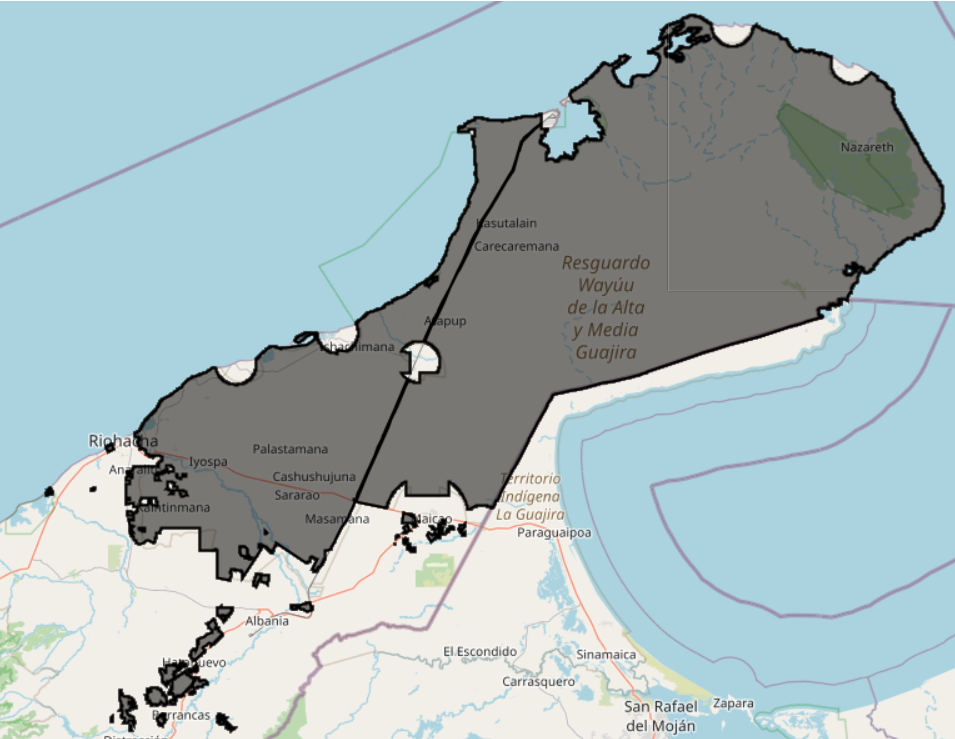

This image represents the boundary area of La Guajira. This shape file was extracted from ArcGIS data repositry.

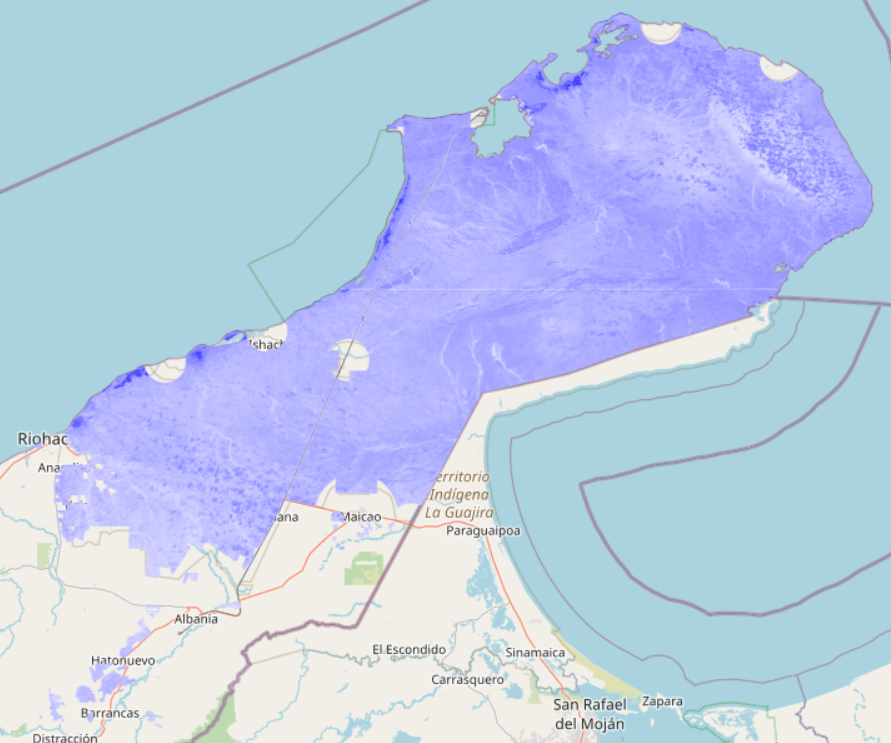

The image above represents the NDWI data mapped regarding coordinates —the more blue the data, the stronger the indication of water presence. Therefore, along the coastal lines, we can observe a dark color that indicates the presence of mangroves, which naturally occur in this area.

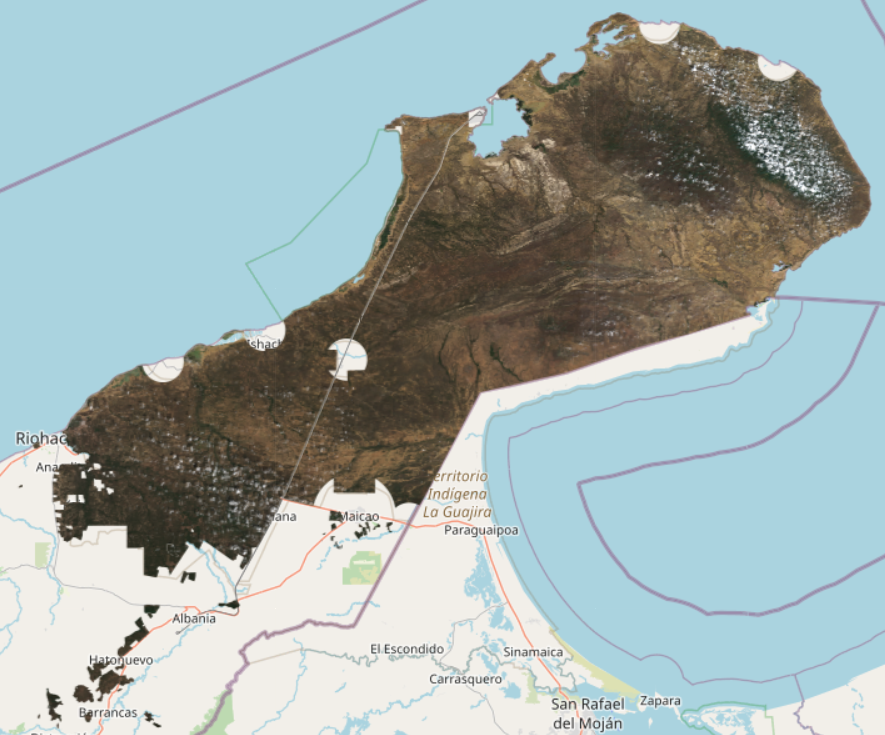

Above, we can see the geographical map of La Guajira, where vegetation along the northern and southern parts covers the area due to climate variations. In the southern part, there is nearly 3,000 mm of rainfall as it is closer to the Sierra Nevada de Santa Marta, which creates lush green vegetation. Along the northern shore, xeric shrubs and mangroves flourish thanks to the presence of sea breeze, rainfall, and the collective efforts by the Colombian government to protect Macuria and Tayrona national parks.


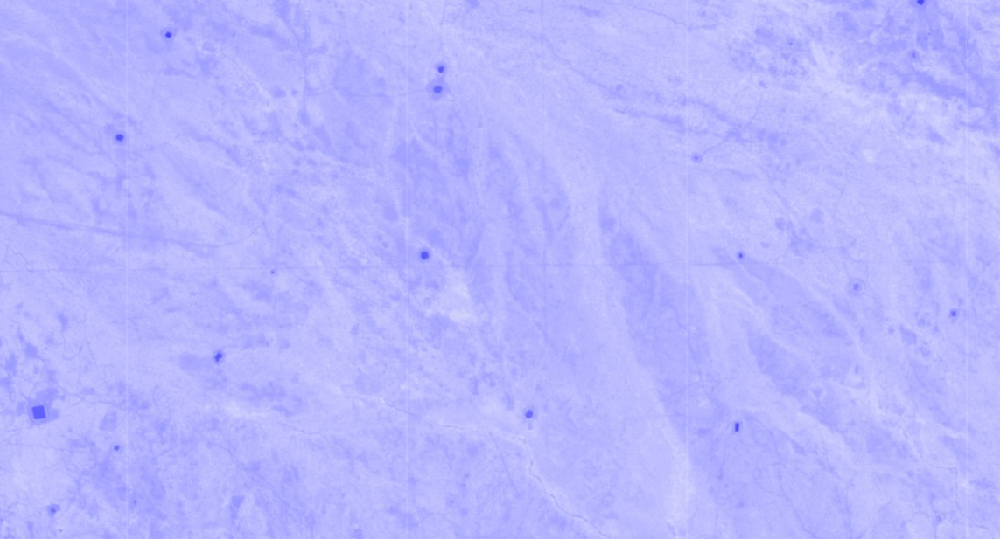

This image is a small cross-section of "La Guajira desert" at a scale of 500m, where we can see small waterbodies, which are approximately 10m puddles during the months of February and March. Although there is water, it's not enough for daily consumption, and on top of that, its highly changing presence makes it an unreliable resource. Due to the extreme heat in the desert, the available water might disappear very quickly.

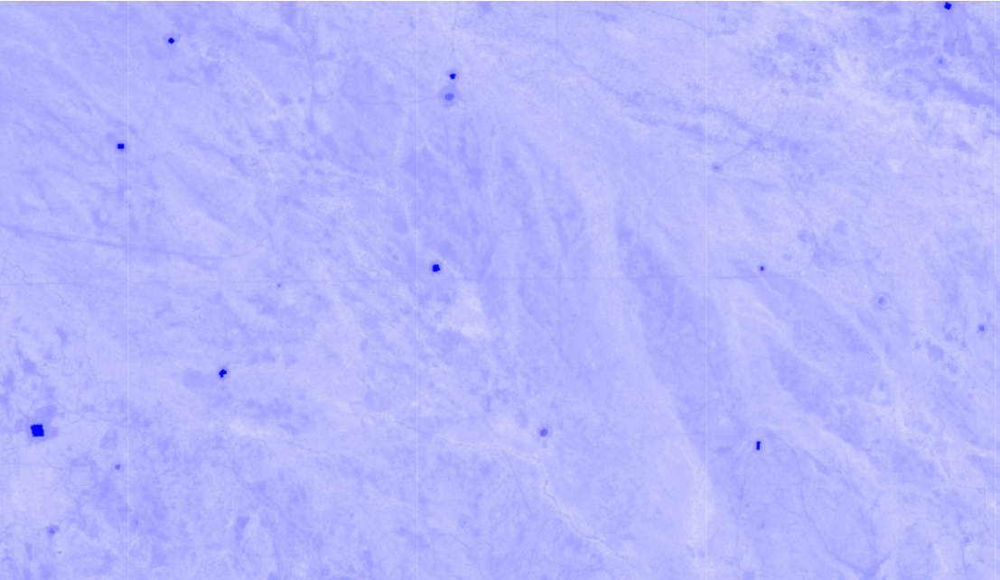

The image above was created using a water mask (mask >= 0.2) to make it easier to identify water bodies —it highlights water bodies with slightly higher filtering. Therefore, dark blue colored areas —indicate that the area had more water bodies present or that water bodies were more frequently present. We used the median to highlight these points (a high ratio of water presence) so we can have a higher probability of water presence.

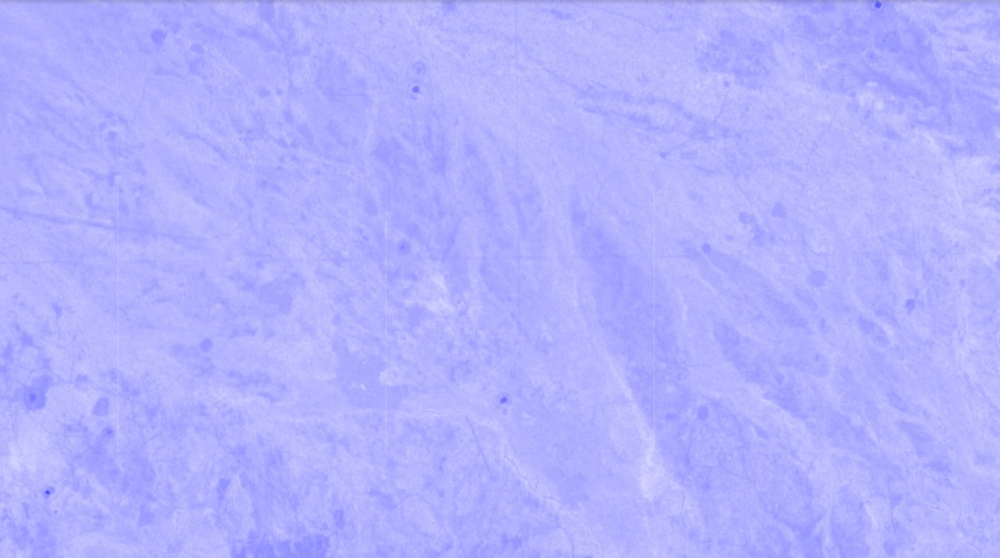

Image from 2020

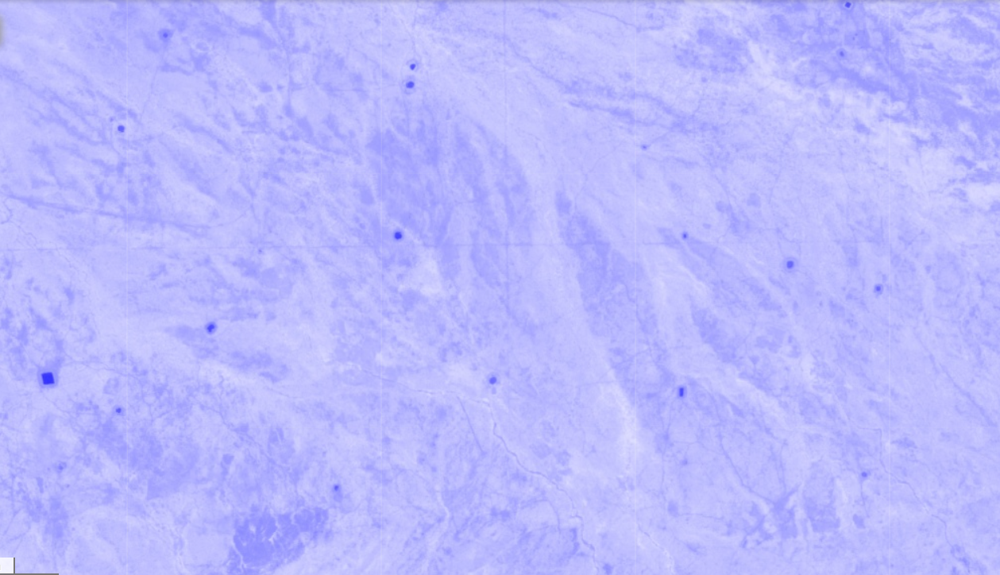

Image from 2021

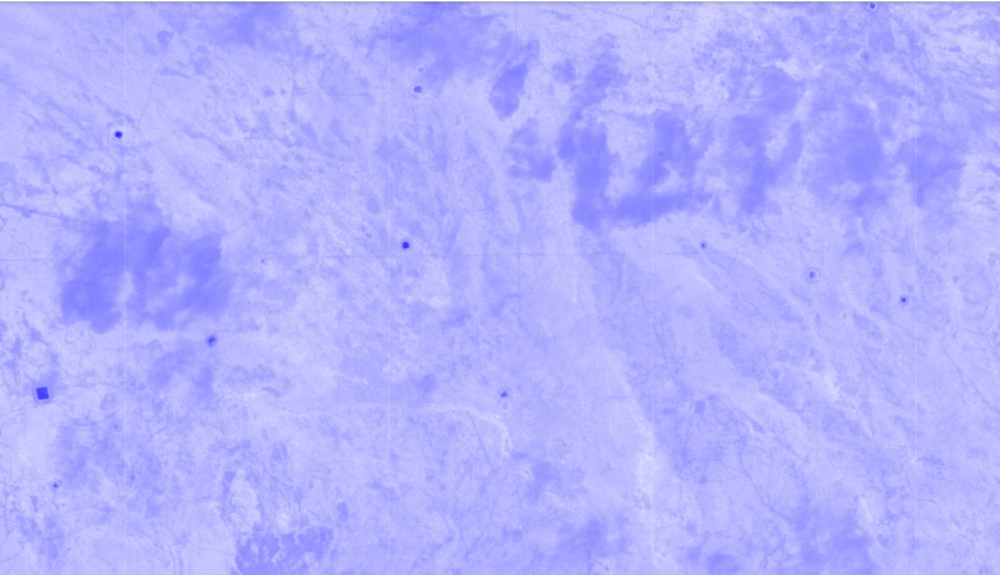

Image from 2022

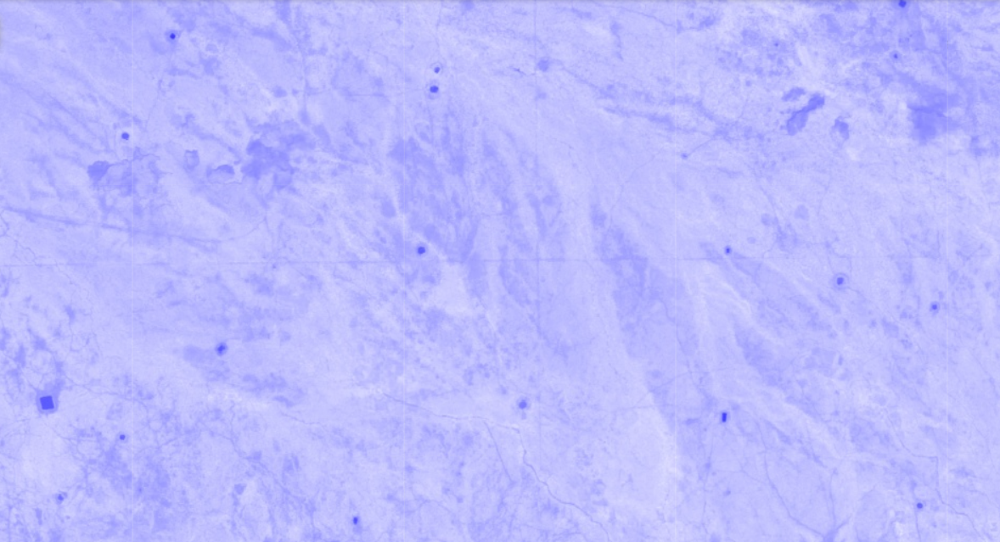

Image from 2023

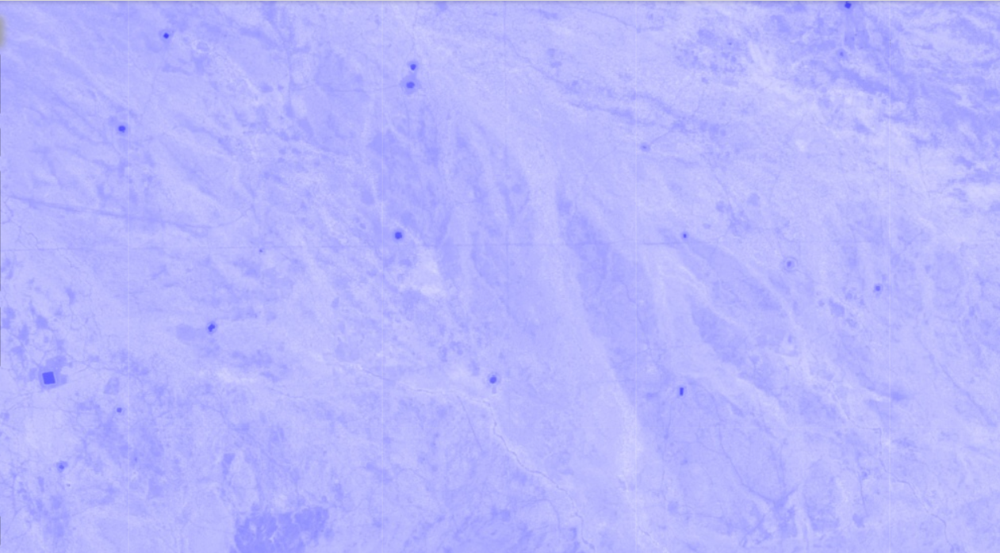

Image from 2024

From the images above, we can see that some waterbodies are more stable than others, which have shifted over the years. Additionally, the water bodies identified using the water mask most of the time last longer, which proves the water mask's reliability —despite their size in finding water. Later, a major shift in waterbodies appeared after 2020, when more water bodies formed. Then, from 2021 to 2022, water bodies remained the same size with just a few alterations. However, in 2022, we detected the presence of clouds, which contributes to false negatives. Therefore, we must carefully monitor cloud masking —either too much or too little masking could lead to classification errors, thus contributing to a bad-performing model.

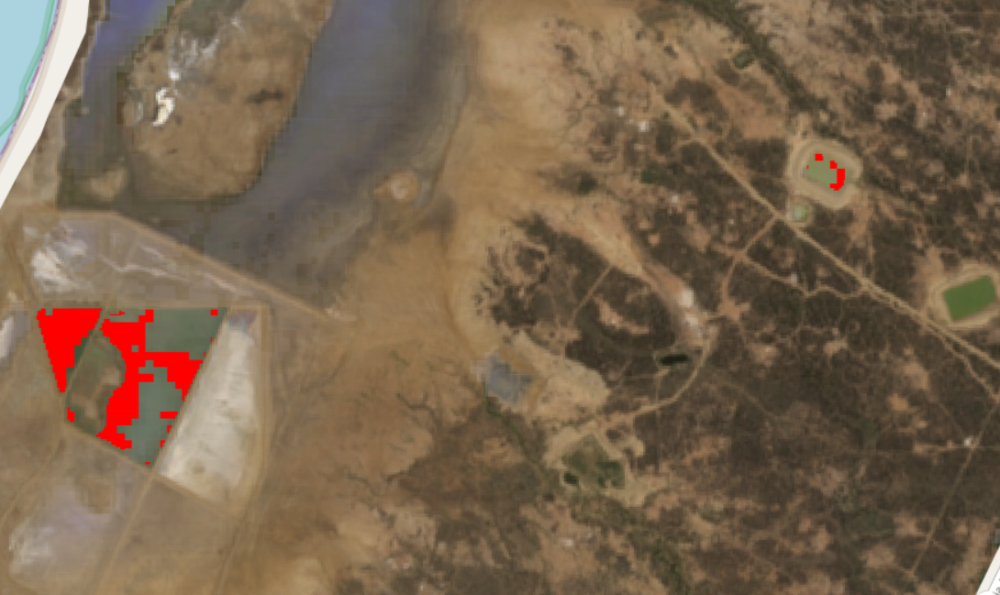

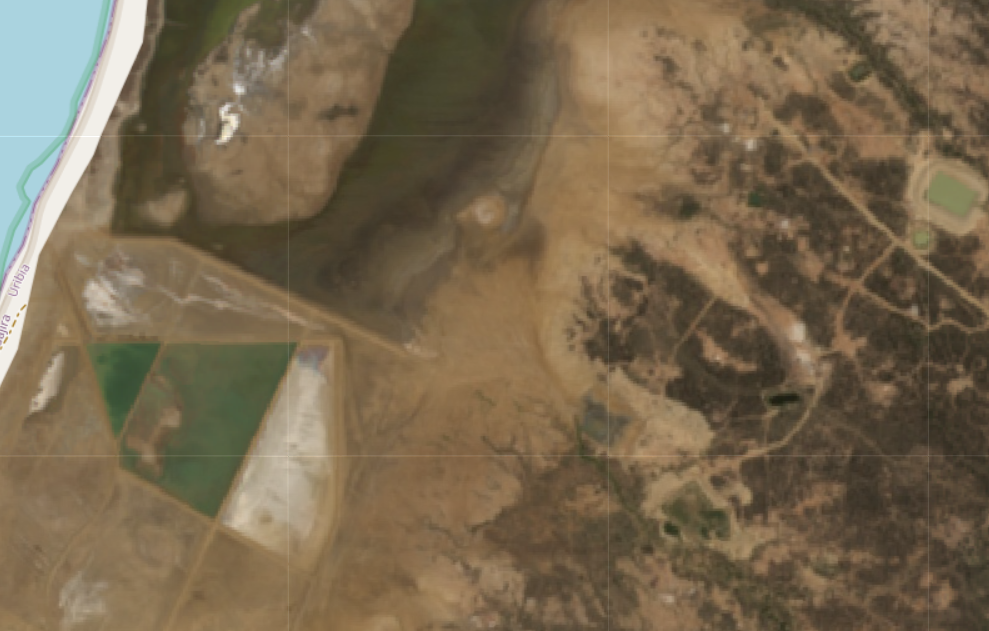

The image above, captured at a scale of 300m, displays the west coast of the "La Guajira." We identify that waterbodies, especially in these coastal and mangrove areas, have a brown color due to the high presence of slit and algae. However, regardless of the color of the water, its reflecting property when applying light holds. Therefore, combining JSR surface reflectance and NDWI improves data collection because they complement each other. For instance, the red pixels in the image are either points missed by NDWI but captured by JSR or points missed by JSR surface reflectance but caught by NDWI. Hence, it is crucial to use both methods to check for errors and validate the data as they seem to complement each other with a few errors.

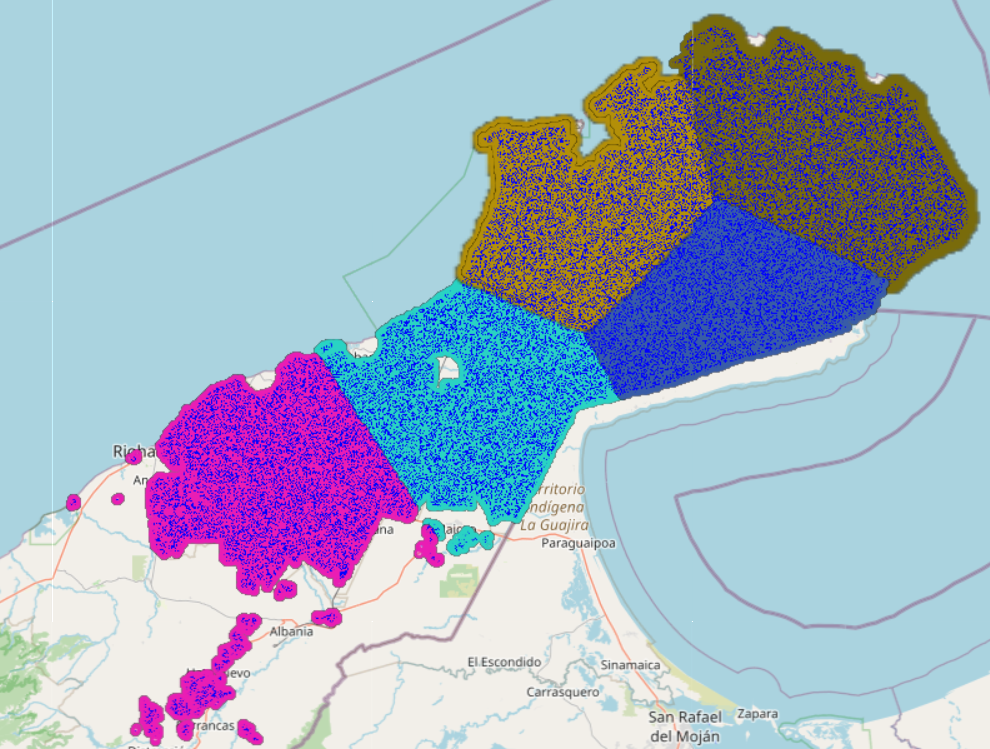

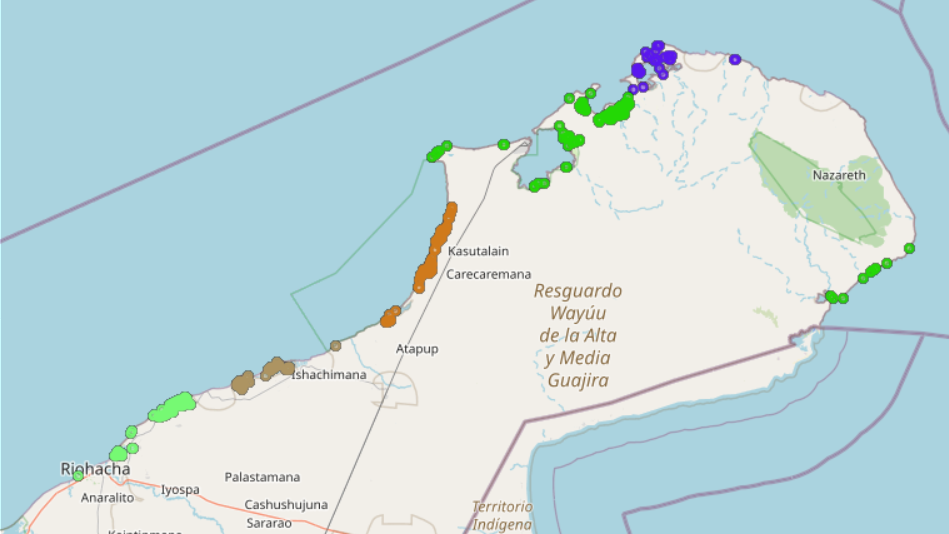

When using K-Means clustering with either random or real NDWI data, the results differ completely. For instance, in the first map, where the data is random, the clusters are spread out without any clear pattern, but in the second map, which uses real NDWI values, the clusters mostly form along the coast. This happens because NDWI helps detect water, but real data shows where water is present, so K-Means is capable of finding meaningful groups when the data is real, especially in coastal areas where water is more common.

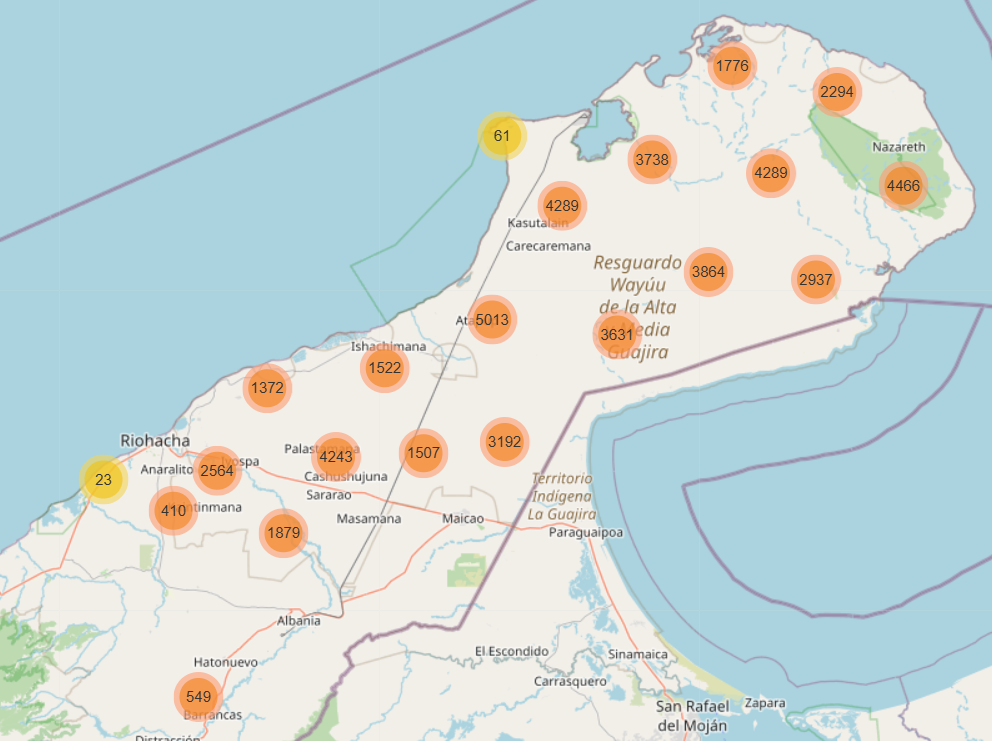

This map shows clusters found using DBSCAN in the "La Guajira," each cluster is an orange circle with a number inside that indicates the number of points in that group. We can observe large clusters in places like Nazareth (4466), Carecaremana (4289), and the center of Resguardo Wayúu (3864 and 3631). There are also many points grouped near Riohacha (2564), Cashushujuna (4243), and areas near Albania and Barrancas. Smaller groups, 23 near Anaralito and 61 on the coast show fewer points. These clusters help us understand where water or drought-related data points are grouped closely together.

DBSCAN produced better results than K-Means because it can find groups of different shapes and sizes without needing to choose the number of groups before. This algorithm also reveals points that don’t belong anywhere (outliers), critical when working with real-world data like water, where groups are not always clear or evenly spread out.

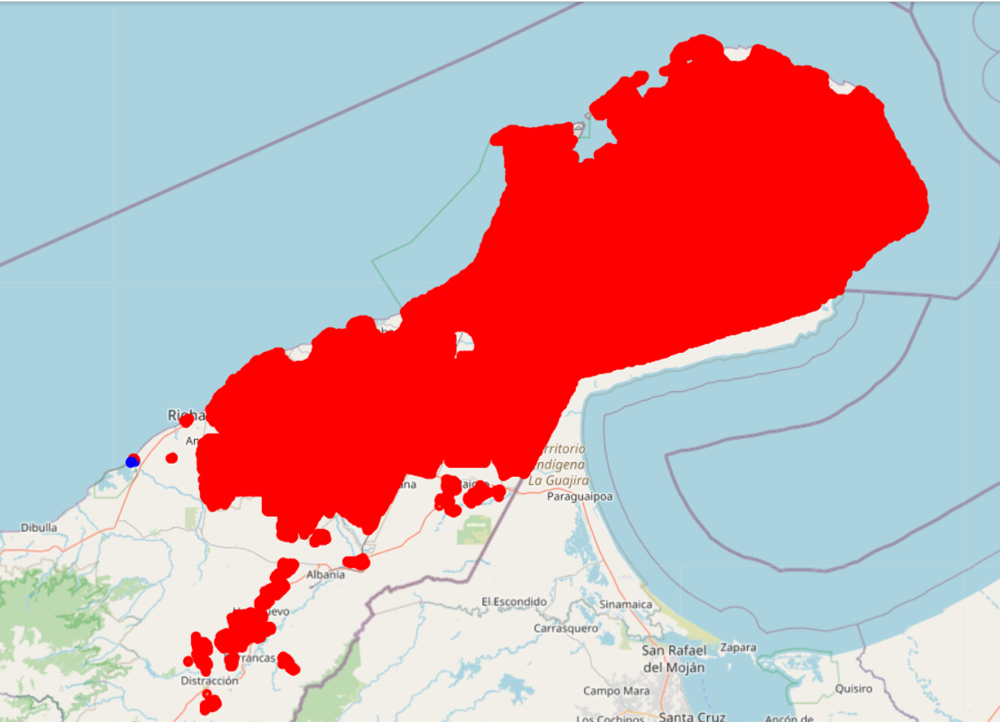

The image above follows a color code based on water closeness. Thus, red dots signify that a point is far from water, while blue dots represent proximity to water. Most of the area is red, meaning many places in "La Guajira" are not near a considerable number of water sources. This kind of map helps us understand which areas may need more attention for water access or drought-related support.

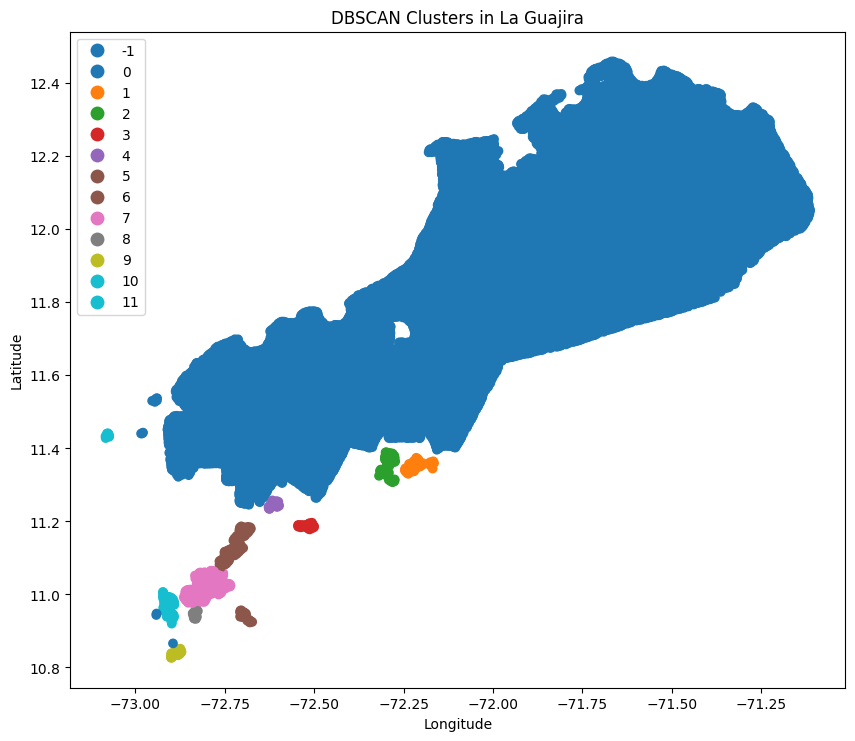

DBSCAN grouped points in La Guajira based on their closeness to each other. For instance, Cluster 0 (the large blue area) covers most of the northern and coastal zones, where although the points are scattered, they are still close enough to form a large group. These areas are flat and similar, so DBSCAN sees them as one big cluster. In the south, smaller groups formed near towns like Distracción, Albania, and Barrancas. These places have points packed more densely, possibly due to local water sources or farming. The successful application of DBSCAN in this specific scenario is due to its ability to detect naturally occurring groups without selecting the number of groups prior to application. It shows both spread-out and small condensed areas, which helps to identify areas where people might need more help during droughts.








## 6.2 Graphs and Charts
- Bar charts showing average NDWI forecast per cluster and water proximity analysis.
- Line plots comparing historical NDWI vs. forecast changes.

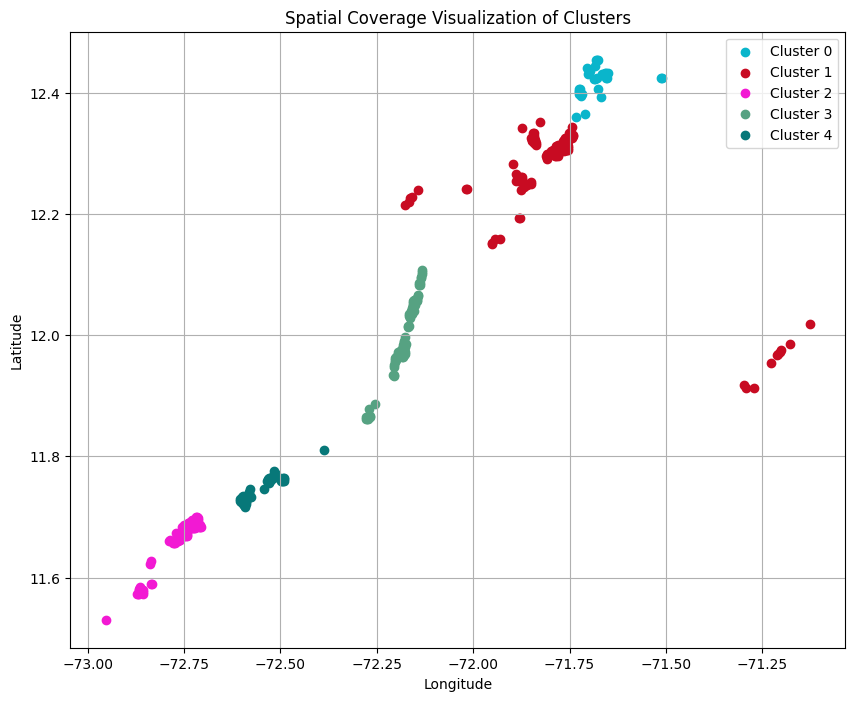

The plot above shows, based on their geographic location, different clusters scattered across "La Guajira," where each color represents a separate cluster. The points in the graph are placed according to their longitude and latitude. We can see that the clusters form long vertical patterns, which might follow rivers, roads, or other natural features in the region. The top part of the plot (near latitude 12.4) includes some coastal or northern areas, while the bottom part (around latitude 11.6) represents more inland or southern locations. This spatial view helps us understand how the clusters cover the region and shows where each group of similar data points is located on the map —a strategic tool for planning water resources well in advance before droughts occur.

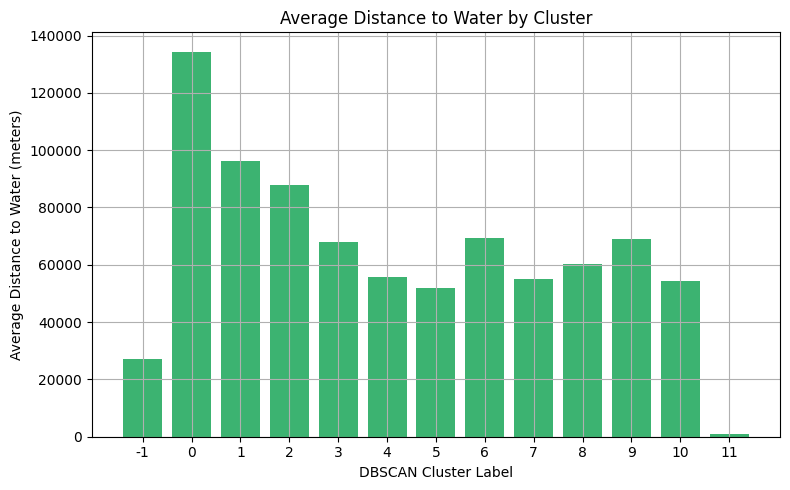

This bar chart,  "Average Distance to Water by Cluster," shows the distance between each cluster and the nearest water source. For instance, Cluster 0 has the utmost distance (135,000 meters) from water sources because it encompasses large dry areas in the middle and north, where there are very few rivers or lakes. Then, Clusters 1 and 2 are also far from water. These are likely in the southeast, near places like Maicao, where the land is dry and rivers are rare. Cluster 11 has the shortest distance to water, near zero—probably because it is close to the coast near Riohacha or Nazareth, where water is easy to find. Finally, Clusters 4, 5, and 10 are in the south near Albania, Distracción, and Barrancas, where rivers like the Ranchería are nearby. These areas have medium distances to water. This chart helps us to identify which places have less access to water and need more help during droughts in La Guajira.

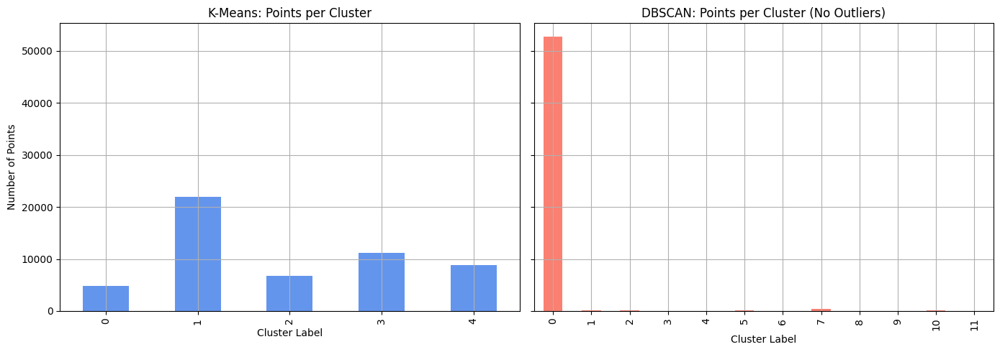

This chart compares K-Means and DBSCAN grouping methods in La Guajira. On the left, the K-Means chart shows points spread more evenly across five clusters. Conversely, on the right, DBSCAN organizes the majority of the points into one large cluster (cluster 0), a few smaller ones, and many outliers (not shown here). This difference happens because K-Means forces all points into a set number of clusters, even when they don’t really belong together. In contrast, DBSCAN groups only the points that are close to each other, leaving out those that are too far apart. In La Guajira, where there are large dry areas and some dense local zones near water, DBSCAN works better. DBSCAN produces more natural and meaningful clusters, especially for environmental studies such as drought or water access. It also detects outliers, which are crucial for spotting isolated or at-risk regions. Overall, DBSCAN is more flexible and accurate for mapping real-world patterns in regions like La Guajira.

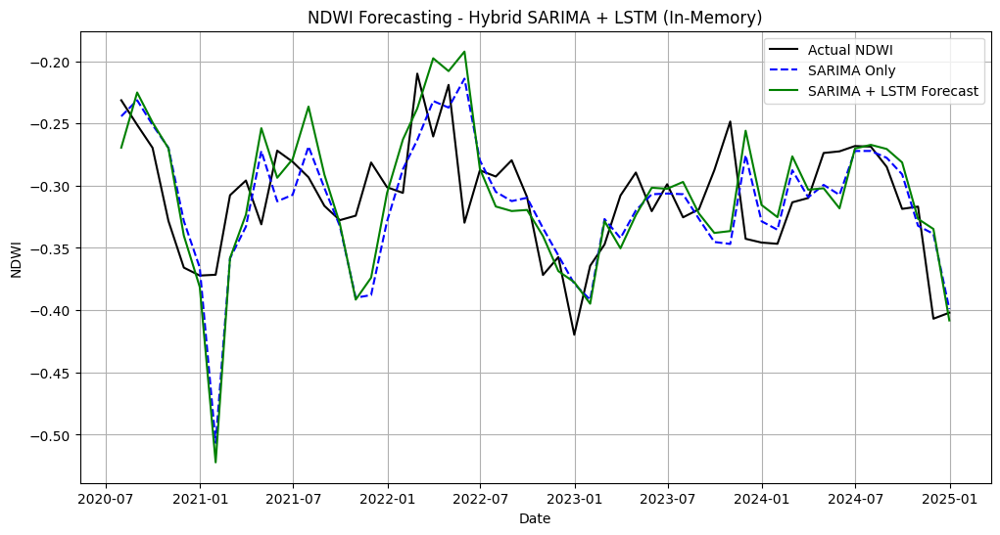

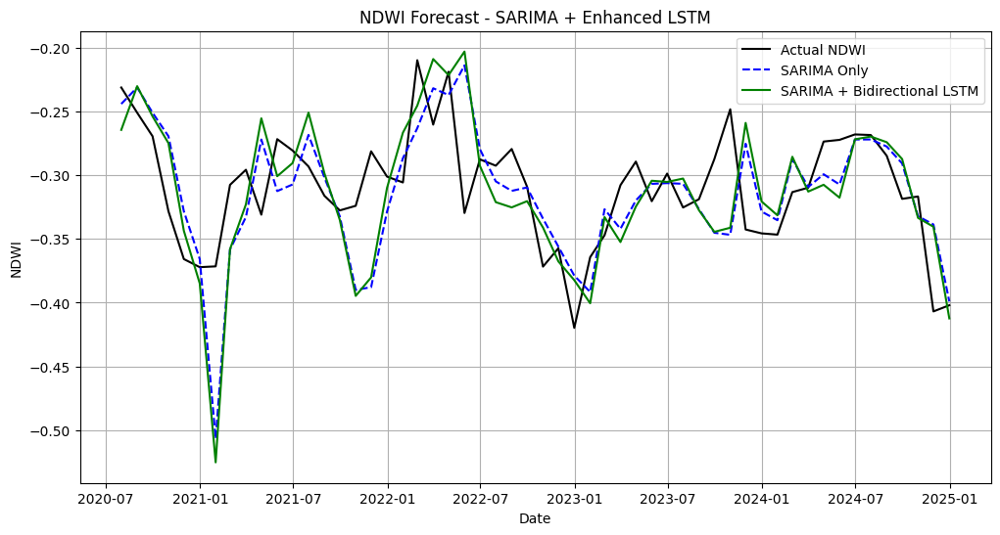

These two graphs show how well NDWI (Normalized Difference Water Index) was predicted in La Guajira from mid-2020 to early 2025. The black line is the actual NDWI trend, which reflects real water conditions in the region. NDWI dropped sharply around early 2021 and again in late 2024, likely due to dry seasons or droughts. The blue dashed line shows predictions from SARIMA, which follows the general trend but misses some sudden changes. The green lines in both graphs are improved predictions. In the first graph, the green line follows the black line more closely than SARIMA, especially during dry periods. In the second graph, the green line (from a stronger model) is even closer to the actual NDWI, especially during quick drops and peaks in 2022 and 2023. This means the second model predicted La Guajira’s water changes more accurately over time. These results help us understand when and where water levels might rise or fall, which is important for managing water in a dry region like La Guajira.

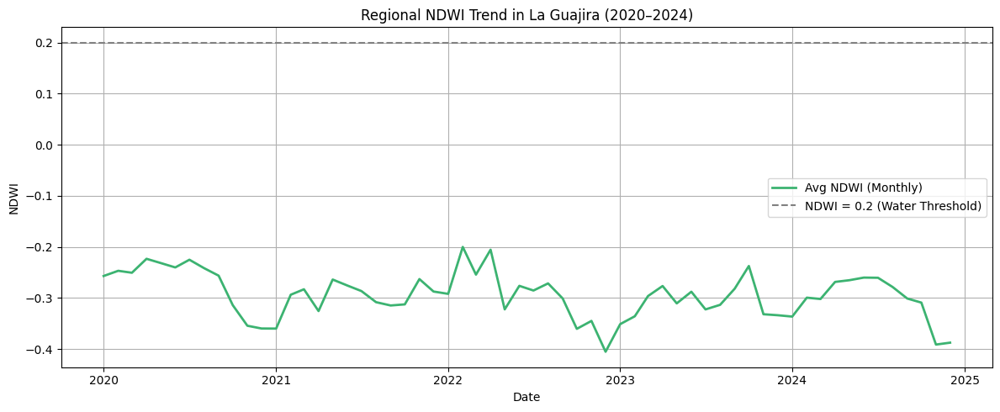

This graph shows how the amount of surface water in La Guajira changed from 2020 to 2024 using NDWI (Normalized Difference Water Index). NDWI tells us how much water is on the land. The green line shows the average NDWI each month, and the dashed grey line at 0.2 is the level where water is clearly present. In La Guajira, the values always stay below 0.2, which means there is very little surface water in the region. This matches what we know about La Guajira’s geography—it is a dry and semi-desert area with low rainfall and very few rivers. Some small peaks in the graph could be from short rainy seasons or storms, but overall, water is limited. In late 2024, the NDWI drops even more, which might be caused by drought or less rain during that time. This trend is important for understanding climate effects and planning water use in farming, drinking supply, and drought response for the people living in La Guajira.

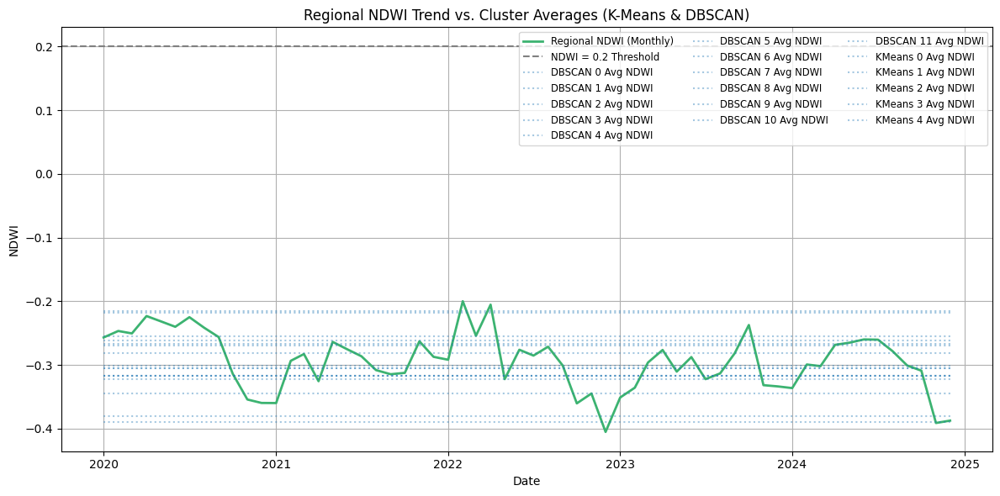

This chart shows how the monthly NDWI (Normalized Difference Water Index) of La Guajira compares to the average NDWI of different clusters formed using DBSCAN and K-Means. The green line is the overall regional NDWI from 2020 to 2024, and the dotted lines represent the average NDWI for each cluster. All cluster averages are below the 0.2 threshold line, meaning most areas have low surface water. This matches La Guajira’s dry climate and limited rainfall. The chart helps identify which areas are drier and shows that both clustering methods give useful insights for drought planning and water resource management.

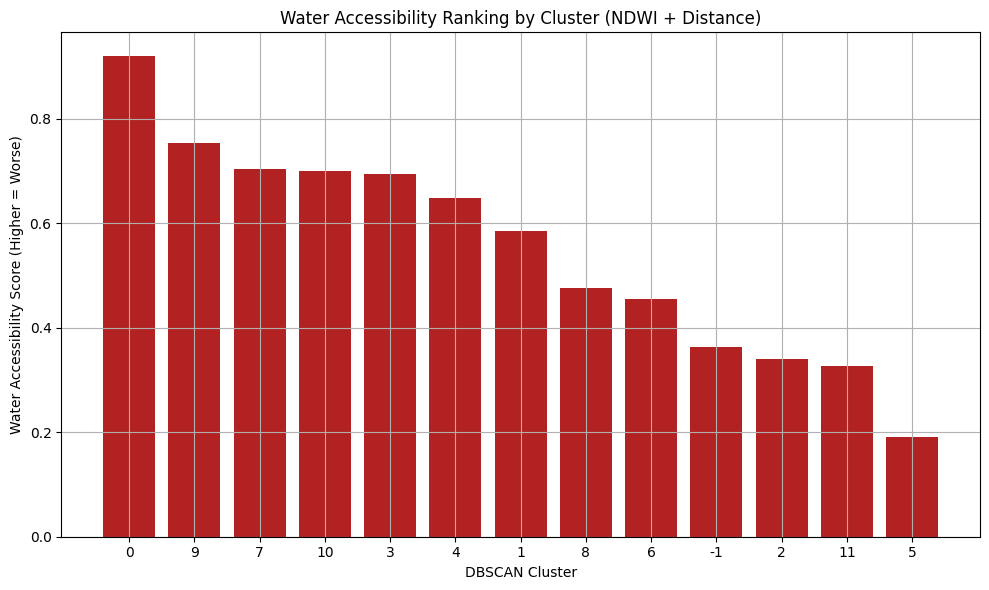



This chart ranks DBSCAN clusters in La Guajira based on how hard it is to access water, using two main factors: distance to the nearest water source and the dryness level (NDWI). A higher score means worse water access.

**Cluster 0** has the worst score. It covers a vast inland area across the **northeast and central desert zones**, including the **Alta Guajira** region and parts of the **Resguardo Wayúu**, where both surface water and vegetation are extremely limited. **Clusters 9 and 7** also show poor accessibility and likely correspond to **eastern interior lands** stretching toward **Nazareth** and **Punta Gallinas**, both remote and water-scarce zones.

**Clusters 10, 3, and 4** lie closer to **Maicao**, **south of Uribia**, and central parts of La Guajira. They still suffer from water scarcity due to dry soil and long distances to rivers.

**Clusters 1 and 8**, with moderate scores, are probably around the **central corridor** between **Manaure** and **Riohacha**, where occasional water channels and infrastructure provide some access.

Better water access appears in **Cluster 2 and Cluster 11**, near **Riohacha**, **Palastamana**, and **Nazareth’s green patch**, where proximity to the coast or seasonal streams improves conditions.

**Cluster 5**, ranked best, is found in **southern La Guajira**, including **Barrancas**, **Distracción**, and near the **Ranchería River**, where water is more available due to higher vegetation, nearby rivers, and slightly better infrastructure.

This detailed cluster-based water ranking helps identify high-risk drought zones and can guide water supply efforts, emergency relief, and long-term planning in La Guajira. In contingency plans it also helps people move towards a morse sustainable place to live in case of adverse conditions.

## 6.3 Key Takeaways
- Summarize findings: drought-exposed clusters, stable water sources, and actionable solutions.

Many areas in La Guajira, especially in the north and center like Alta Guajira and the Resguardo Wayúu region, suffer from very poor access to water. These places are far from rivers and have very dry land. To help people living there, the government and aid groups should build rainwater tanks, dig deep wells, and use solar-powered pumps to reach underground water. Also, trucks can bring water during dry months to remote villages.

People in these dry areas can also collect and save rainwater during the short rainy season. Simple rainwater harvesting systems on rooftops can be built using low-cost materials. With a little training, local people can learn how to build, clean, and maintain these systems so they last longer and work better.

To avoid future water shortages, we can use smart computer models like the SARIMA + Bidirectional LSTM model. This model helps predict when droughts might happen. If the government or community leaders get early warnings, they can prepare in advance, save more water, or delay farming activities until it's safer.

It is also very important to work together with the Wayúu communities and other rural groups. These people know the land well and can give useful advice. Water plans should include their ideas and respect their traditions. Community-based water programs often work better because local people care for and manage the systems more responsibly.

Lastly, areas like Barrancas, Distracción, Fonseca, and Riohacha’s coast have better water access. These places can grow food, raise animals, or store extra water that can be shared with nearby dry areas. We can also build more water points in these stable zones to support nearby villages when there is a drought.

Combining all these is simple yet effective way to reduce the problems relating to drought.